# Collision Stats

This project is designed to examine the automobile traffic collision history from years 2016 - 2020 in California. Through various visualizations techniques, the goal will be to spot any patterns in collisions in the nature of their occurence and identify any possible predictive factors that might lead to collisions.

# Libraries

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime
from pandas.tseries.holiday import USFederalHolidayCalendar as calendar
import matplotlib as mpl
import matplotlib.pylab as plt
from matplotlib.colors import ListedColormap
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

# Data Understanding

In [2]:
collision_colnames=['CASE_ID', 'ACCIDENT_YEAR', 'PROC_DATE', 'JURIS', 'COLLISION_DATE', 'COLLISION_TIME', 
                    'OFFICER_ID', 'REPORTING_DISTRICT', 'DAY_OF_WEEK', 'CHP_SHIFT', 'POPULATION', 'CNTY_CITY_LOC',
                    'SPECIAL_COND', 'BEAT_TYPE', 'CHP_BEAT_TYPE', 'CITY_DIVISION_LAPD', 'CHP_BEAT_CLASS',
                    'BEAT_NUMBER', 'PRIMARY_RD', 'SECONDARY_RD', 'DISTANCE', 'DIRECTION', 'INTERSECTION',
                    'WEATHER_1', 'WEATHER_2', 'STATE_HWY_IND', 'CALTRANS_COUNTY', 'CALTRANS_DISTRICT', 'STATE_ROUTE',
                    'ROUTE_SUFFIX', 'POSTMILE_PREFIX', 'POSTMILE', 'LOCATION_TYPE', 'RAMP_INTERSECTION', 
                    'SIDE_OF_HWY', 'TOW_AWAY', 'COLLISION_SEVERITY', 'NUMBER_KILLED', 'NUMBER_INJURED', 
                    'PARTY_COUNT', 'PRIMARY_COLL_FACTOR', 'PCF_CODE_OF_VIOL', 'PCF_VIOL_CATEGORY', 'PCF_VIOLATION',
                    'PCF_VIOL_SUBSECTION', 'HIT_AND_RUN', 'TYPE_OF_COLLISION', 'MVIW', 'PED_ACTION', 'ROAD_SURFACE',
                    'ROAD_COND_1', 'ROAD_COND_2', 'LIGHTING', 'CONTROL_DEVICE', 'CHP_ROAD_TYPE', 
                    'PEDESTRIAN_ACCIDENT', 'BICYCLE_ACCIDENT', 'MOTORCYCLE_ACCIDENT', 'TRUCK_ACCIDENT', 
                    'NOT_PRIVATE_PROPERTY', 'ALCOHOL_INVOLVED', 'STWD_VEHTYPE_AT_FAULT', 'CHP_VEHTYPE_AT_FAULT',
                    'COUNT_SEVERE_INJ', 'COUNT_VISIBLE_INJ', 'COUNT_COMPLAINT_PAIN', 'COUNT_PED_KILLED', 
                    'COUNT_PED_INJURED', 'COUNT_BICYCLIST_KILLED', 'COUNT_BICYCLIST_INJURED', 'COUNT_MC_KILLED',
                    'COUNT_MC_INJURED', 'PRIMARY_RAMP', 'SECONDARY_RAMP']

party_colnames=['CASE_ID', 'PARTY_NUMBER', 'PARTY_TYPE', 'AT_FAULT', 'PARTY_SEX', 'PARTY_AGE', 'PARTY_SOBRIETY',
                'PARTY_DRUG_PHYSICAL', 'DIR_OF_TRAVEL', 'PARTY_SAFETY_EQUIP_1', 'PARTY_SAFETY_EQUIP_2',
                'FINAN_RESPONS', 'SP_INFO_1', 'SP_INFO_2', 'SP_INFO_3', 'OAF_VIOLATION_CODE', 'OAF_VIOL_CAT',
                'OAF_VIOL_SECTION', 'OAF_VIOLATION_SUFFIX', 'OAF_1', 'OAF_2', 'PARTY_NUMBER_KILLED',
                'PARTY_NUMBER_INJURED', 'MOVE_PRE_ACC', 'VEHICLE_YEAR', 'VEHICLE_MAKE', 'STWD_VEHICLE_TYPE',
                'CHP_VEH_TYPE_TOWING', 'CHP_VEH_TYPE_TOWED', 'RACE', 'INATTENTION', 'SPECIAL_INFO_F', 
                'SPECIAL_INFO_G']

victim_colnames=['CASE_ID', 'PARTY_NUMBER', 'VICTIM_ROLE', 'VICTIM_SEX', 'VICTIM_AGE', 'VICTIM_DEGREE_OF_INJURY',
                 'VICTIM_SEATING_POSITION', 'VICTIM_SAFETY_EQUIP_1', 'VICTIM_SAFETY_EQUIP_2', 'VICTIM_EJECTED']

In [3]:
# import in data
collisions_records = pd.read_csv('CollisionRecords.txt', error_bad_lines=False)  
parties_records = pd.read_csv('PartyRecords.txt', names=party_colnames, header=0)
victims_records = pd.read_csv('VictimRecords.txt', names=victim_colnames, header=0)
pd.set_option('display.max_rows', None) # 60
pd.set_option('display.max_columns', None) # 20

b'Skipping line 1619075: expected 74 fields, saw 75\n'


In [4]:
display(collisions_records.head())
display(parties_records.head())
display(victims_records.head())

,CASE_ID,ACCIDENT_YEAR,PROC_DATE,JURIS,COLLISION_DATE,COLLISION_TIME,OFFICER_ID,REPORTING_DISTRICT,DAY_OF_WEEK,CHP_SHIFT,POPULATION,CNTY_CITY_LOC,SPECIAL_COND,BEAT_TYPE,CHP_BEAT_TYPE,CITY_DIVISION_LAPD,CHP_BEAT_CLASS,BEAT_NUMBER,PRIMARY_RD,SECONDARY_RD,DISTANCE,DIRECTION,INTERSECTION,WEATHER_1,WEATHER_2,STATE_HWY_IND,CALTRANS_COUNTY,CALTRANS_DISTRICT,STATE_ROUTE,ROUTE_SUFFIX,POSTMILE_PREFIX,POSTMILE,LOCATION_TYPE,RAMP_INTERSECTION,SIDE_OF_HWY,TOW_AWAY,COLLISION_SEVERITY,NUMBER_KILLED,NUMBER_INJURED,PARTY_COUNT,PRIMARY_COLL_FACTOR,PCF_CODE_OF_VIOL,PCF_VIOL_CATEGORY,PCF_VIOLATION,PCF_VIOL_SUBSECTION,HIT_AND_RUN,TYPE_OF_COLLISION,MVIW,PED_ACTION,ROAD_SURFACE,ROAD_COND_1,ROAD_COND_2,LIGHTING,CONTROL_DEVICE,CHP_ROAD_TYPE,PEDESTRIAN_ACCIDENT,BICYCLE_ACCIDENT,MOTORCYCLE_ACCIDENT,TRUCK_ACCIDENT,NOT_PRIVATE_PROPERTY,ALCOHOL_INVOLVED,STWD_VEHTYPE_AT_FAULT,CHP_VEHTYPE_AT_FAULT,COUNT_SEVERE_INJ,COUNT_VISIBLE_INJ,COUNT_COMPLAINT_PAIN,COUNT_PED_KILLED,COUNT_PED_INJURED,COUNT_BICYCLIST_KILLED,COUNT_BICYCLIST_INJURED,COUNT_MC_KILLED,COUNT_MC_INJURED,PRIMARY_RAMP,SECONDARY_RAMP
0,81715,2020,20200622,1941,20200314,745,11342,212,6,5,7,1941,0,0,0,NaN,0,003,PATTERSON ST,ATLANTIC AV,0.0,NaN,Y,B,-,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Y,0,0,0,2,A,-,03,22350.0,NaN,N,C,C,A,A,H,-,A,D,0,NaN,NaN,NaN,NaN,Y,NaN,-,NaN,0,0,0,0,0,0,0,0,0,-,-
1,726202,2020,20200930,3600,20200726,250,8945,064,7,5,5,3612,0,0,0,NaN,0,005,AMARGOSA,MARICOPA RD,0.0,NaN,-,A,-,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Y,0,0,0,1,A,-,03,22350.0,NaN,M,E,I,A,A,H,-,C,D,0,NaN,NaN,NaN,NaN,Y,NaN,A,01,0,0,0,0,0,0,0,0,0,-,-
2,6292799,2016,20180925,1942,20160311,1130,41054,0729,5,5,7,1942,0,0,0,G,0,6TL11,BEVERLY BL,HUDSON AV,0.0,NaN,Y,B,-,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Y,1,1,0,2,A,-,03,22350.0,NaN,N,D,C,A,A,H,-,A,D,0,NaN,NaN,Y,NaN,Y,NaN,C,02,0,0,0,0,0,0,0,1,0,-,-
3,6292800,2016,20180927,1942,20160413,515,40164,1415,3,5,7,1942,0,0,0,N,0,7T23,LINCOLN BL,SUNSET AV,38.0,N,N,B,-,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Y,1,1,0,2,A,-,11,21954.0,A,N,G,B,D,A,H,-,C,A,0,Y,NaN,NaN,NaN,Y,NaN,N,60,0,0,0,1,0,0,0,0,0,-,-
4,6292881,2017,20190405,1602,20170831,107,1484,50,4,5,4,1602,0,0,0,NaN,0,004,9 1/4 AV,E GRANGEVILLE BL,0.0,NaN,Y,A,-,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Y,1,2,4,2,A,-,12,21453.0,A,N,D,C,A,A,H,-,C,A,0,NaN,NaN,NaN,NaN,Y,Y,D,72,4,0,0,0,0,0,0,0,0,-,-


,CASE_ID,PARTY_NUMBER,PARTY_TYPE,AT_FAULT,PARTY_SEX,PARTY_AGE,PARTY_SOBRIETY,PARTY_DRUG_PHYSICAL,DIR_OF_TRAVEL,PARTY_SAFETY_EQUIP_1,PARTY_SAFETY_EQUIP_2,FINAN_RESPONS,SP_INFO_1,SP_INFO_2,SP_INFO_3,OAF_VIOLATION_CODE,OAF_VIOL_CAT,OAF_VIOL_SECTION,OAF_VIOLATION_SUFFIX,OAF_1,OAF_2,PARTY_NUMBER_KILLED,PARTY_NUMBER_INJURED,MOVE_PRE_ACC,VEHICLE_YEAR,VEHICLE_MAKE,STWD_VEHICLE_TYPE,CHP_VEH_TYPE_TOWING,CHP_VEH_TYPE_TOWED,RACE,INATTENTION,SPECIAL_INFO_F,SPECIAL_INFO_G
0,81715,1,1,Y,F,35,H,H,N,L,G,Y,-,3,-,-,-,NaN,NaN,N,-,0,0,B,2007.0,FORD,-,NaN,NaN,O,NaN,-,-
1,81715,2,1,N,F,43,H,H,N,M,G,Y,-,3,-,-,-,NaN,NaN,N,-,0,0,B,2019.0,-,-,NaN,NaN,H,NaN,-,-
2,726202,1,1,Y,-,998,G,G,N,-,-,NaN,-,-,-,-,-,NaN,NaN,N,-,0,0,B,2005.0,-,A,1.0,NaN,NaN,NaN,-,-
3,6292799,1,1,N,M,44,A,-,W,M,G,Y,-,3,-,NaN,33,21801.0,A,A,-,0,0,E,2015.0,CHEVROLET,A,1.0,NaN,B,NaN,-,-
4,6292799,2,1,Y,M,41,-,E,E,P,W,N,-,3,-,-,-,NaN,NaN,N,-,1,0,B,2005.0,KAWASAKI,C,2.0,NaN,W,NaN,-,-


,CASE_ID,PARTY_NUMBER,VICTIM_ROLE,VICTIM_SEX,VICTIM_AGE,VICTIM_DEGREE_OF_INJURY,VICTIM_SEATING_POSITION,VICTIM_SAFETY_EQUIP_1,VICTIM_SAFETY_EQUIP_2,VICTIM_EJECTED
0,6292799,1,2,F,29,0,6,M,G,0
1,6292799,2,1,M,41,1,1,P,W,1
2,6292800,2,3,M,70,1,9,-,-,3
3,6292881,1,1,M,34,2,1,B,H,1
4,6292881,1,2,M,22,2,6,B,H,1


# Data Preparation

In [5]:
# collisions table selected features for visualizations
collisions_subset = ['CASE_ID', 'ACCIDENT_YEAR', 'COLLISION_DATE', 'COLLISION_TIME', 'DAY_OF_WEEK', 
                     'CNTY_CITY_LOC', 'PRIMARY_RD', 'SECONDARY_RD', 'WEATHER_1', 'WEATHER_2', 'COLLISION_SEVERITY',
                     'NUMBER_KILLED', 'NUMBER_INJURED', 'PARTY_COUNT', 'PCF_VIOL_CATEGORY', 'HIT_AND_RUN', 
                     'TYPE_OF_COLLISION', 'MVIW', 'ROAD_COND_1', 'ROAD_COND_2', 'LIGHTING', 'ALCOHOL_INVOLVED', 
                     'STWD_VEHTYPE_AT_FAULT', 'COUNT_PED_KILLED', 'COUNT_PED_INJURED', 'COUNT_BICYCLIST_KILLED',
                     'COUNT_BICYCLIST_INJURED', 'COUNT_MC_KILLED', 'COUNT_MC_INJURED', 'INTERSECTION', 
                     'STATE_HWY_IND', 'DIRECTION', 'ROAD_SURFACE', 'TOW_AWAY', 'CONTROL_DEVICE']

# party table selected features for visualizations
parties_subset = ['CASE_ID', 'AT_FAULT', 'PARTY_SEX', 'PARTY_AGE', 'PARTY_SOBRIETY', 'OAF_VIOL_CAT', 
                  'MOVE_PRE_ACC', 'STWD_VEHICLE_TYPE', 'RACE']

# victims table selected features for visualizations
victims_subset = ['CASE_ID', 'VICTIM_ROLE', 'VICTIM_SEX', 'VICTIM_AGE', 'VICTIM_DEGREE_OF_INJURY',
                  'VICTIM_SAFETY_EQUIP_1', 'VICTIM_SAFETY_EQUIP_2', 'VICTIM_EJECTED']

In [6]:
# create new dataframes with relevant data
int_collisions_df = collisions_records[collisions_subset].copy()
int_parties_df = parties_records[parties_subset].copy()
int_victims_df = victims_records[victims_subset].copy()

In [7]:
display(int_collisions_df.info())
display(int_parties_df.info())
display(int_victims_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2294884 entries, 0 to 2294883
Data columns (total 35 columns):
 #   Column                   Dtype 
---  ------                   ----- 
 0   CASE_ID                  int64 
 1   ACCIDENT_YEAR            int64 
 2   COLLISION_DATE           int64 
 3   COLLISION_TIME           int64 
 4   DAY_OF_WEEK              int64 
 5   CNTY_CITY_LOC            int64 
 6   PRIMARY_RD               object
 7   SECONDARY_RD             object
 8   WEATHER_1                object
 9   WEATHER_2                object
 10  COLLISION_SEVERITY       object
 11  NUMBER_KILLED            int64 
 12  NUMBER_INJURED           int64 
 13  PARTY_COUNT              int64 
 14  PCF_VIOL_CATEGORY        object
 15  HIT_AND_RUN              object
 16  TYPE_OF_COLLISION        object
 17  MVIW                     object
 18  ROAD_COND_1              object
 19  ROAD_COND_2              object
 20  LIGHTING                 object
 21  ALCOHOL_INVOLVED         object

None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4575682 entries, 0 to 4575681
Data columns (total 9 columns):
 #   Column             Dtype 
---  ------             ----- 
 0   CASE_ID            int64 
 1   AT_FAULT           object
 2   PARTY_SEX          object
 3   PARTY_AGE          int64 
 4   PARTY_SOBRIETY     object
 5   OAF_VIOL_CAT       object
 6   MOVE_PRE_ACC       object
 7   STWD_VEHICLE_TYPE  object
 8   RACE               object
dtypes: int64(2), object(7)
memory usage: 314.2+ MB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1866262 entries, 0 to 1866261
Data columns (total 8 columns):
 #   Column                   Dtype 
---  ------                   ----- 
 0   CASE_ID                  int64 
 1   VICTIM_ROLE              object
 2   VICTIM_SEX               object
 3   VICTIM_AGE               int64 
 4   VICTIM_DEGREE_OF_INJURY  object
 5   VICTIM_SAFETY_EQUIP_1    object
 6   VICTIM_SAFETY_EQUIP_2    object
 7   VICTIM_EJECTED           object
dtypes: int64(2), object(6)
memory usage: 113.9+ MB


None

In [8]:
# visual check if any of the values are noncomprehensible 
dataframes = [int_collisions_df, int_parties_df, int_victims_df]
for df in dataframes:
    # temporarily dropping these labels from results as they have a lot of distinct values 
    value_check = df.drop(['CASE_ID', 'COLLISION_DATE', 'COLLISION_TIME', 'PRIMARY_RD',
                           'SECONDARY_RD'], errors='ignore', axis=1)
    print('---------- begin -----------\n')
    for col in value_check.columns:
        print(" ")
        print(f'---{col}---')
        print(value_check[col].value_counts(dropna=False))
    print('\n---------- end -----------\n\n')

---------- begin -----------

 
---ACCIDENT_YEAR---
2016    491571
2017    486425
2018    482274
2019    470263
2020    364351
Name: ACCIDENT_YEAR, dtype: int64
 
---DAY_OF_WEEK---
5    375289
4    343905
3    337002
2    334080
1    321245
6    312677
7    270686
Name: DAY_OF_WEEK, dtype: int64
 
---CNTY_CITY_LOC---
1942    276354
1900     96725
3400     49635
3711     47599
1941     40958
109      35643
3801     33123
4313     32928
3404     30912
3700     30416
3600     29711
3300     29310
1500     28905
3313     25761
3001     24910
3905     23272
3900     20122
1000     19272
100      18729
3604     17480
1502     16791
1955     16659
3607     16177
3610     15822
5000     15124
5400     14592
2700     14564
700      12743
4400     12466
5002     12456
1925     12227
3019     11975
1005     11934
3315     11904
4900     11812
2400     11339
1992     11115
3009     11006
3026     10921
105      10585
1949     10252
1985      9789
1953      9670
4200      9618
3015      9223
3616  

A    1944124
B     257398
C      74722
E       6406
-       5959
F       2884
D       2302
G       1089
Name: WEATHER_1, dtype: int64
 
---WEATHER_2---
-    2230459
C      48807
B       5860
G       5675
D       1453
E       1430
F       1200
Name: WEATHER_2, dtype: int64
 
---COLLISION_SEVERITY---
0    1268642
4     529678
3     265512
0      98550
2      59262
4      32227
3      18290
1      16142
2       5403
1       1156
          21
M          1
Name: COLLISION_SEVERITY, dtype: int64
 
---NUMBER_KILLED---
0     2277586
1       16078
2        1006
3         155
4          49
5           6
6           3
13          1
Name: NUMBER_KILLED, dtype: int64
 
---NUMBER_INJURED---
0     1378193
1      655819
2      179443
3       54079
4       17462
5        6238
6        2178
7         786
8         348
9         171
10         62
11         34
12         14
15         12
16          8
14          7
13          7
17          4
18          4
20          3
29          2
31          2
33    

---------- begin -----------

 
---VICTIM_ROLE---
2    761679
1    602300
1    245564
2    128901
3     61768
4     44574
3     10413
4      7676
5      2725
5       646
         13
m         1
l         1
0         1
Name: VICTIM_ROLE, dtype: int64
 
---VICTIM_SEX---
M    920358
F    902244
-     43486
4        79
X        44
3        21
2        11
          7
1         4
N         4
W         1
G         1
U         1
B         1
Name: VICTIM_SEX, dtype: int64
 
---VICTIM_AGE---
998    56978
19     48955
21     48646
20     48295
22     47347
18     46125
23     45802
24     45000
25     44551
26     42207
27     40720
28     38233
29     36630
17     35466
30     35185
31     32339
32     31076
33     29675
34     28693
16     28272
35     27972
36     27031
37     25972
38     24646
39     24341
40     23413
15     23106
41     22425
47     21933
49     21720
42     21698
50     21635
45     21607
46     21548
48     21482
44     21313
43     21248
53     21239
51     21149
52    

**verify the authenticity of some of the outliers present in the data:**

`int_collisions_df[int_collisions_df['NUMBER_KILLED'] == 13]`

> https://www.sbsun.com/2016/10/23/13-killed-31-injured-in-tour-bus-crash-on-10-freeway-near-palm-springs/


`int_collisions_df[int_collisions_df['NUMBER_KILLED'] == 10]`

> https://abc7.com/northern-california-bus-crash-students-killed-student-norcal-orland/31948/


`int_collisions_df[int_collisions_df['NUMBER_INJURED'] == 49]`

> http://www.insidesocal.com/sgvcrime/2013/08/22/17099/


`int_collisions_df[int_collisions_df['COUNT_PED_INJURED'] == 14]`

> https://losangeles.cbslocal.com/2012/08/29/8-injured-when-car-jumps-curb-at-south-la-elementary-school/


`int_collisions_df[int_collisions_df['COUNT_PED_INJURED'] == 26]`

> no records found


`int_collisions_df[int_collisions_df['COUNT_MC_KILLED'] == 3]`

> https://abc7.com/1091275/

#### collisions dataframe preprocessing

In [9]:
# create a copy of the dataframe
collisions_df_set = int_collisions_df.copy()

# replace duplicate values
collisions_df_set['PCF_VIOL_CATEGORY'].replace('-', '- ', inplace=True)
collisions_df_set['TYPE_OF_COLLISION'].replace('- ', '-', inplace=True)
collisions_df_set['TYPE_OF_COLLISION'].replace(' ', '-', inplace=True)
collisions_df_set['CONTROL_DEVICE'].replace(' ', '-', inplace=True)
collisions_df_set['MVIW'].replace(' ', '-', inplace=True)
collisions_df_set['LIGHTING'].replace(' ', '-', inplace=True)
collisions_df_set['ALCOHOL_INVOLVED'].replace(np.nan, '-', inplace=True)
collisions_df_set['STWD_VEHTYPE_AT_FAULT'].replace(np.nan, '-', inplace=True)
collisions_df_set['DIRECTION'].replace(np.nan, '-', inplace=True)
collisions_df_set['ROAD_SURFACE'].replace(' ', '-', inplace=True)
collisions_df_set['TOW_AWAY'].replace(np.nan, '-', inplace=True)

# filter out nonsensical values
collisons_mask = (collisions_df_set['TYPE_OF_COLLISION'] != 'I') & (collisions_df_set['TYPE_OF_COLLISION'] != 'M') &\
                 (collisions_df_set['TYPE_OF_COLLISION'] != 'N') & (collisions_df_set['TYPE_OF_COLLISION'] != 'O') &\
                 (collisions_df_set['WEATHER_1'] != 'N') & (collisions_df_set['INTERSECTION'] != 'W') &\
                 (collisions_df_set['MVIW'] != 'K') & (collisions_df_set['MVIW'] != 'O') &\
                 (collisions_df_set['MVIW'] != 'U') & (collisions_df_set['ROAD_SURFACE'] != 'H') &\
                 (collisions_df_set['ROAD_SURFACE'] != 'J') & (collisions_df_set['ROAD_SURFACE'] != 'I') &\
                 (collisions_df_set['CONTROL_DEVICE'] != 'E') & (collisions_df_set['CONTROL_DEVICE'] != 'H') &\
                 (collisions_df_set['CONTROL_DEVICE'] != 'G') & (collisions_df_set['CONTROL_DEVICE'] != 'Q') &\
                 (collisions_df_set['COLLISION_SEVERITY'] != ' ') & (collisions_df_set['COLLISION_SEVERITY'] != 'N') &\
                 (collisions_df_set['COLLISION_SEVERITY'] != 'M')
collisions_df = collisions_df_set[collisons_mask]

# update datatype of columns to be the same 
collisions_df['COLLISION_SEVERITY'] = collisions_df['COLLISION_SEVERITY'].astype(str)
collisions_df['COLLISION_SEVERITY'] = collisions_df['COLLISION_SEVERITY'].astype(int)

#### parties dataframe preprocessing

In [10]:
# create a copy of the dataframe
parties_df_set = int_parties_df.copy()

# replace duplicate values
parties_df_set['PARTY_SEX'].replace('X', '-', inplace=True)
parties_df_set['MOVE_PRE_ACC'].replace(' ', '-', inplace=True)
parties_df_set['RACE'].replace(np.nan, '-', inplace=True)

# filter out nonsensical values
parties_mask = (parties_df_set['MOVE_PRE_ACC'] != '0') & (parties_df_set['STWD_VEHICLE_TYPE'] != '04')             
parties_df = parties_df_set[parties_mask]

#### victims dataframe preprocessing

In [11]:
# create a copy of the dataframe
victims_df_set = int_victims_df.copy()

# filter out nonsensical values
victims_mask = (victims_df_set['VICTIM_ROLE'] != ' ') & (victims_df_set['VICTIM_ROLE'] != 0) &\
               (victims_df_set['VICTIM_ROLE'] != 'm') & (victims_df_set['VICTIM_ROLE'] != 'l') &\
               (victims_df_set['VICTIM_SEX'] != '4') & (victims_df_set['VICTIM_SEX'] != 'X') &\
               (victims_df_set['VICTIM_SEX'] != '3') & (victims_df_set['VICTIM_SEX'] != '2') &\
               (victims_df_set['VICTIM_SEX'] != ' ') & (victims_df_set['VICTIM_SEX'] != '1') &\
               (victims_df_set['VICTIM_SEX'] != 'N') & (victims_df_set['VICTIM_SEX'] != 'W') &\
               (victims_df_set['VICTIM_SEX'] != 'B') & (victims_df_set['VICTIM_SEX'] != 'G') &\
               (victims_df_set['VICTIM_SEX'] != 'U') & (victims_df_set['VICTIM_SAFETY_EQUIP_1'] != '5') &\
               (victims_df_set['VICTIM_SAFETY_EQUIP_1'] != '1') & (victims_df_set['VICTIM_SAFETY_EQUIP_1'] != '0') &\
               (victims_df_set['VICTIM_SAFETY_EQUIP_1'] != '3') & (victims_df_set['VICTIM_SAFETY_EQUIP_1'] != ' ') &\
               (victims_df_set['VICTIM_SAFETY_EQUIP_1'] != 'z') & (victims_df_set['VICTIM_SAFETY_EQUIP_1'] != '2') &\
               (victims_df_set['VICTIM_SAFETY_EQUIP_1'] != '4') & (victims_df_set['VICTIM_SAFETY_EQUIP_1'] != ',') &\
               (victims_df_set['VICTIM_SAFETY_EQUIP_2'] != '0') & (victims_df_set['VICTIM_SAFETY_EQUIP_2'] != ' ') &\
               (victims_df_set['VICTIM_SAFETY_EQUIP_2'] != '1') & (victims_df_set['VICTIM_EJECTED'] != 'w') &\
               (victims_df_set['VICTIM_DEGREE_OF_INJURY'] != ' ') & (victims_df_set['VICTIM_DEGREE_OF_INJURY'] != 'M') &\
               (victims_df_set['VICTIM_EJECTED'] != 'o') & (victims_df_set['VICTIM_EJECTED'] != '9') &\
               (victims_df_set['VICTIM_EJECTED'] != ' ') & (victims_df_set['VICTIM_EJECTED'] != 'n') &\
               (victims_df_set['VICTIM_EJECTED'] != 'g') & (victims_df_set['VICTIM_EJECTED'] != 'N') &\
               (victims_df_set['VICTIM_EJECTED'] != '4') & (victims_df_set['VICTIM_EJECTED'] != '`') &\
               (victims_df_set['VICTIM_EJECTED'] != 'j') & (victims_df_set['VICTIM_EJECTED'] != 'O') &\
               (victims_df_set['VICTIM_EJECTED'] != 'y') & (victims_df_set['VICTIM_EJECTED'] != 'b') &\
               (victims_df_set['VICTIM_EJECTED'] != 'G')

victims_df = victims_df_set[victims_mask]

# update datatype of columns to be the same 
victims_df['VICTIM_ROLE'] = victims_df['VICTIM_ROLE'].astype(str)
victims_df['VICTIM_ROLE'] = victims_df['VICTIM_ROLE'].astype(int)

victims_df['VICTIM_DEGREE_OF_INJURY'] = victims_df['VICTIM_DEGREE_OF_INJURY'].astype(str)
victims_df['VICTIM_DEGREE_OF_INJURY'] = victims_df['VICTIM_DEGREE_OF_INJURY'].astype(int)

victims_df['VICTIM_EJECTED'] = victims_df['VICTIM_EJECTED'].astype(str)

# Visualizations

## General Formatting

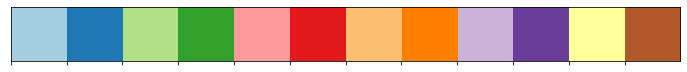

In [12]:
sns.palplot(sns.color_palette("Paired",12))
sns.set_palette(sns.color_palette("Paired",12))
sns.set_theme(style='ticks')
sns.set_style("whitegrid")

## Code Legend

In [13]:
# replace codes with descriptive text
day_values = {1: '1 - Monday',
              2: '2 - Tuesday',
              3: '3 - Wednesday',
              4: '4 - Thursday',
              5: '5 - Friday',
              6: '6 - Saturday',
              7: '7- Sunday'}

severity_values = {0: '0 - PDO (Property Damage Only)',
                   1: '1 - Fatal',
                   2: '2 - Injury (Severe)',
                   3: '3 - Injury (Other Visible)',
                   4: '4 - Injury (Complaint of Pain)'}

type_values = {'A': 'A - Head-On',
               'B': 'B - Sideswipe',
               'C': 'C - Rear End',
               'D': 'D - Broadside',
               'E': 'E - Hit Object',
               'F': 'F - Overturned',
               'G': 'G - Vehicle/Pedestrian',
               'H': 'H - Other',
               '-': '- Not Stated'}

pcf_values = {'01': '01: Driving/Bicycling Under Influence of Alcohol/Drug',
              '02': '02: Impeding Traffic',
              '03': '03: Unsafe Speed',
              '04': '04: Following Too Closely',
              '05': '05: Wrong Side of Road',
              '06': '06: Improper Passing',
              '07': '07: Unsafe Lane Change',
              '08': '08: Improper Turning',
              '09': '09: Automobile Right of Way',
              '10': '10: Pedestrian Right of Way',
              '11': '11: Pedestrian Violation',
              '12': '12: Traffic Signals and Signs',
              '13': '13: Hazardous Parking',
              '14': '14: Lights',
              '15': '15: Brakes',
              '16': '16: Other Equipment',
              '17': '17: Other Hazardous Violation',
              '18': '18: Other Than Driver (or Pedestrian)',
              '19': '19: ',
              '20': '20: ',
              '21': '21: Unsafe Starting or Backing',
              '22': '22: Other Improper Driving',
              '23': '23: Pedestrian or "Other" Under the Influence of Alcohol or Drug',
              '24': '24: Fell Asleep',
              '00': '00: Unknown',
              '- ' : '- Not Stated'}

light_values ={'A': 'A - Daylight',
               'B': 'B - Dusk - Dawn',
               'C': 'C - Dark - Street Lights',
               'D': 'D - Dark - No Street Lights',
               'E': 'E - Dark - Street Lights Not Functioning',
               '-': '- Not Stated'}

weather_values = {'A': 'A - Clear',
                  'B': 'B - Cloudy',
                  'C': 'C - Raining',
                  'D': 'D - Snowing',
                  'E': 'E - Fog',
                  'F': 'F - Other',
                  'G': 'G - Wind',
                  '-': '- Not Stated'}

road_values = {'A': 'A - Holes, Deep Ruts',
               'B': 'B - Loose Material on Roadway',
               'C': 'C - Obstruction on Roadway',
               'D': 'D - Construction or Repair Zone',
               'E': 'E - Reduced Roadway Width',
               'F': 'F - Flooded',
               'G': 'G - Other',
               'H': 'H - No Unusual Condition',
               '-': '- Not Stated'}

surface_values = {'A': 'A - Dry',
                  'B': 'B - Wet',
                  'C': 'C - Snowy or Icy',
                  'D': 'D - Slippery (Muddy, Oily, etc.)',
                  '-': '- Not Stated'}

race_values = {'A': 'A - Asian',
               'B': 'B - Black',
               'H': 'H - Hispanic',
               'W': 'W - White',
               'O': 'O - Other',
               '-' : '- Not stated'}

partyatfault_vehicle_values = {'A': 'A: Passenger Car/Station Wagon',
                               'B': 'B: Passenger Car with Trailer',
                               'C': 'C: Motorcycle/Scooter',
                               'D': 'D: Pickup or Panel Truck',
                               'E': 'E: Pickup or Panel Truck with Trailer',
                               'F': 'F: Truck or Truck Tractor',
                               'G': 'G: Truck or Truck Tractor with Trailer',
                               'H': 'H: Schoolbus',
                               'I': 'I: Other Bus',
                               'J': 'J: Emergency Vehicle',
                               'K': 'K: Highway Construction Equipment',
                               'L': 'L: Bicycle',
                               'M': 'M: Other Vehicle',
                               'N': 'N: Pedestrian',
                               'O': 'O: Moped',
                               '-': '- Not Stated'}

partyatfault_movement_values = {'A': 'A: Stopped',
                                'B': 'B: Proceeding Straight',
                                'C': 'C: Ran Off Road',
                                'D': 'D: Making Right Turn',
                                'E': 'E: Making Left Turn',
                                'F': 'F: Making U-Turn',
                                'G': 'G: Backing',
                                'H': 'H: Slowing/Stopping',
                                'I': 'I: Passing Other Vehicle',
                                'J': 'J: Changing Lanes',
                                'K': 'K: Parking Maneuver',
                                'L': 'L: Entering Traffic',
                                'M': 'M: Other Unsafe Turning',
                                'N': 'N: Crossed Into Opposing Lane',
                                'O': 'O: Parked',
                                'P': 'P: Merging',
                                'Q': 'Q: Traveling Wrong Way',
                                'R': 'R: Other',
                                '-': '- Not Stated'}

oaf_values = {'01': '01 - Under Influence in Public (647F)',
              '02': '02 - County Ordinance',
              '03': '03 - City Ordinance',
              '05': '05 - Business/Professions Code',
              '06': '06 - Felony Penal Code',
              '08': '08 - Controlled Substances (Felony Health and Safety)',
              '09': '09 - Health/Safety Code (Misdemeanor)',
              '10': '10 - Penal Code (Misdemeanor)',
              '11': '11 - Streets/Highways Code',
              '13': '13 - Welfare/Institutions Code',
              '15': '15 - Manslaughter',
              '16': '16 - Non-Vehicle Code Not Specified Above',
              '17': '17 - Fish & Game Code',
              '18': '18 - Agriculture Code',
              '19': '19 - Hit and Run',
              '20': '20 - Driving or Bicycling Under the Influence of Alcohol or Drug',
              '21': '21 - Improper Lane Change',
              '22': '22 - Impeding Traffic',
              '23': '23 - Failure to Heed Stop Signal',
              '24': '24 - Failure to Heed Stop Sign',
              '25': '25 - Unsafe Speed',
              '26': '26 - Reckless Driving',
              '27': '27 - Wrong Side of Road',
              '28': '28 - Unsafe Lane Change',
              '29': '29 - Improper Passing',
              '30': '30 - Following Too Closely',
              '31': '31 - Improper Turning',
              '33': '33 - Automobile Right-of-Way',
              '34': '34 - Pedestrian Right-of-Way',
              '35': '35 - Pedestrian Violation',
              '37': '37 - ',
              '38': '38 - Hazardous Parking',
              '39': '39 - Lights',
              '40': '40 - Brakes',
              '43': '43 - Other Equipment',
              '44': '44 - Other Hazardous Movement',
              '46': '46 - Improper Registration',
              '47': '47 - Other Non-Moving Violation', 
              '48': '48 - Excessive Smoke',
              '49': '49 - Excessive Noise',
              '50': '50 - Overweight',
              '51': '51 - Oversize',
              '52': '52 - Over Maximum Speed',
              '53': '53 - Unsafe Starting or Backing',
              '60': '60 - Off-Highway Vehicle Violation',
              '61': '61 - Child Restraint',
              '62': '62 - Seat Belt',
              '63': '63 - Seat Belt (Equipment)',
              '00': '- Not Stated'}

victim_values = {1: '1 - Driver',
                 2: '2 - Passenger*',
                 3: '3 - Pedestrian',
                 4: '4 - Bicyclist',
                 5: '5 - Other*'}

injury_values = {0: '0 - No Injury',
                 1: '1 - Killed',
                 2: '2 - Severe Injury',
                 3: '3 - Other Visible Injury',
                 4: '4 - Complaint of Pain',
                 5: '5 – Suspected Serious Injury',
                 6: '6 – Suspected Minor Injury',
                 7: '7 – Possible Injury'}

eject_values = {'0': '0 - Not Ejected',
                '1': '1 - Fully Ejected',
                '2': '2 - Partially Ejected',
                '3': '3 - Unknown',
                '-': '- - Not Stated'}

mviw_values = {'A': 'A - Non-Collision',
               'B': 'B - Pedestrian',
               'C': 'C - Other Motor Vehicle',
               'D': 'D - Motor Vehicle on Other Roadway',
               'E': 'E - Parked Motor Vehicle',
               'F': 'F - Train',
               'G': 'G - Bicycle',
               'H': 'H - Animal',
               'I': 'I - Fixed Object',
               'J': 'J - Other Object',
               '-': '- Not Stated'}

hitrun_values = {'F': 'F - Felony',
                 'M': 'M - Misdemeanor',
                 'N': 'N - Not Hit and Run'}

direction_values = {'N': 'N - North',
                    'E': 'E - East',
                    'S': 'S - South',
                    'W': 'W - West',
                    '-': '- Not Stated, in Intersection'}


alcohol_values = {'A': 'A - Had Not Been Drinking',
                  'B': 'B - Had Been Drinking, Under Influence',
                  'C': 'C - Had Been Drinking, Not Under Influence',
                  'D': 'D - Had Been Drinking, Impairment Unknown',
                  'G': 'G - Impairment Unknown',
                  'H': 'H - Not Applicable',
                  '-': '- Not Stated'}

## Table of Contents

**Time Statistics**

1. Collision Severity By Year *(heatmap)*
2. Collisions By Month *(barplot - shaded by magnitude)*
3. Collisions Severity By Day of Week *(countplot)*
4. Type of Collision and Number of People Injured/Killed By Day of Week *(boxplot)*
5. Violation Type By Day of Week *(countplot)*
6. Collisions by Time of Day *(barplot/lineplot - pareto diagram)*
7. Collision Severity Based on Time Window *(countplot)*
8. Type of Vehicle Collision Based on Time Window *(countplot)*
9. Other Party Vechicle Type Based on Time Window *(countplot)*
10. Collisions Based on Holidays and Time Window *(countplot)*
11. Hit and Run by Time Window *(countplot)*
12. Similarly, Hit and Run and Collision Severity *(displot: histogram)*
13. PCF Violation Category by Time Window *(barplot - stacked percentage)*

**Conditions Statistics**

14. Collision Severity Based on Lighting *(countplot)*
15. Violation Category Based on Lighting *(heatmap)*
16. Collision Severity Based on Weather *(countplot)*
17. PCF Violation Category Based on Weather *(barplot - stacked percentage/heatmap)*
18. Collision Severity Based on Road Conditions *(jointplot - histogram/countplot)*
19. Collision Severity Based on Intersection/State Hwy *(countplot/scatterplot)*

**Party Statistics**

20. Party By Gender and Age and Race *(stripplot)*
21. Gender/Age/Race of Parties at Fault *(swarmplot & violinplot)*
22. Vehicle Type and Pre-Collision Movement By Age for Parties at Fault *(histogram)*
23. Violation Category By Age for Parties at Fault *(boxenplot)*

**Victim Statistics**

24. Victim Role By Age *(scatterplot)*
25. Victim Injury Level Based on Insufficient Safety Equipment *(FacetGrid: countplot)*

**Collision Statistics**

26. Injuries or Death Based on Violation Category *(pointplot)*
27. Type of Collision and Severity Level For Collisions with Injuries or Death *(countplot)*
28. Type of Collision and Violation Category/What the Vehicle was Involved With *(countplot)*
29. Vehicle Towed Away Based on Collision Severity *(heatmap)*
30. Pre-Collision Direction and Collision Severity *(stripplot & pointplot & violinplot)*

**Alcohol-Involved Statistics**

31. Age/Gender and Sobriety of Party at Fault *(swarmplot)*
32. Alcohol-Involved Collisions Over Time *(overlapping barplots)*
33. Alcohol-Involved Collisions by Vehicle Types and Injuries/Death *(countplot)*
34. Alcohol-Involved Collisions by Date *(barplot)*
35. Alcohol-Involved Collisions by County (Top 20) *(barplot)*

**Pedestrian/Bicycle/Motorcycle Statistics**

36. Total Injuries and Deaths By Time of Day *(barplot)*
37. Non-Vehicular Injuries/Deaths and Roads Where It Occured *(no plot)*

## Time Statistics

### 1. Collision Severity By Year *(heatmap)*

In [116]:
collisions_df['COLLISION_SEVERITY'] = pd.to_numeric(collisions_df['COLLISION_SEVERITY'], errors='ignore')

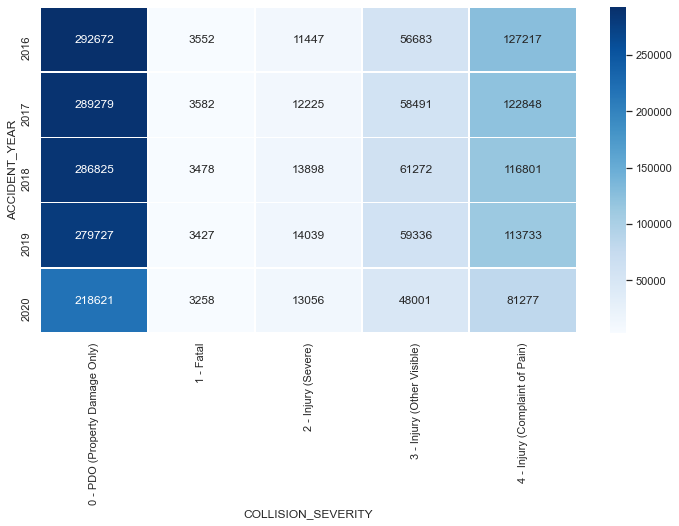

In [122]:
# create dataframe of collision severity levels grouped by year
collisions_grouped_df = collisions_df.copy()
collisions_grouped_df['COLLISION_SEVERITY'].replace(severity_values, inplace=True)

collisions_heatmap_df = pd.DataFrame(collisions_grouped_df.groupby(['COLLISION_SEVERITY','ACCIDENT_YEAR'])['CASE_ID'].count())
collisions_heatmap_df.reset_index(inplace=True)
collision_heatmap = collisions_heatmap_df.pivot(index='ACCIDENT_YEAR', columns='COLLISION_SEVERITY', values='CASE_ID')

# replace column values with descriptive text

# Draw a heatmap with the numeric values in each cell
f, ax = plt.subplots(figsize=(12, 6))
sns.heatmap(collision_heatmap, annot=True, fmt='.0f', linewidths=.5, cmap='Blues', ax=ax)
plt.show();

> **Observations:** The data seems consistent with common knowledge - as most incidents are property damage (0) or injuries with complaint of pain (4). There is also a significant decrease across all severities in 2020, which is inline with less drivers on the road last year due to COVID.

### 2. Collisions By Month *(barplot - shaded by magnitude)*

In [17]:
# convert collision dates to datetime format
collisions_df['COLLISION_DATE'] = collisions_df['COLLISION_DATE'].astype(str)
collisions_df['COLLISION_DATE'] = pd.to_datetime(collisions_df['COLLISION_DATE'])

In [18]:
# create dataframe of collisions grouped by month
collision_months= pd.DataFrame(pd.to_datetime(collisions_df['COLLISION_DATE']).dt.month.value_counts()
                              .sort_index()).set_axis(['January', 'February', 'March', 'April', 'May', 'June', 
                                                       'July', 'August', 'September', 'October', 'November', 
                                                       'December'])
collision_months

,COLLISION_DATE
January,190497
February,183546
March,195508
April,174746
May,185910
June,184005
July,186837
August,197490
September,195581
October,210164


In [19]:
def colors_from_values(values, palette_name):
    '''
    Function to determine the color of individual datapoints - higher values results in a darker color
    
    Args:
        values: data to be sorted and to have colors assigned
        palette_name: desired seaborn color palette
        
    Returns:
        array with the color scheme for the data

    '''
    # normalize the values to range [0, 1]
    normalized = (values - min(values)) / (max(values) - min(values))
    # convert to indices
    indices = np.round(normalized * (len(values) - 1)).astype(np.int32)
    # use the indices to get the colors
    palette = sns.color_palette(palette_name, len(values))
    
    return np.array(palette).take(indices, axis=0)

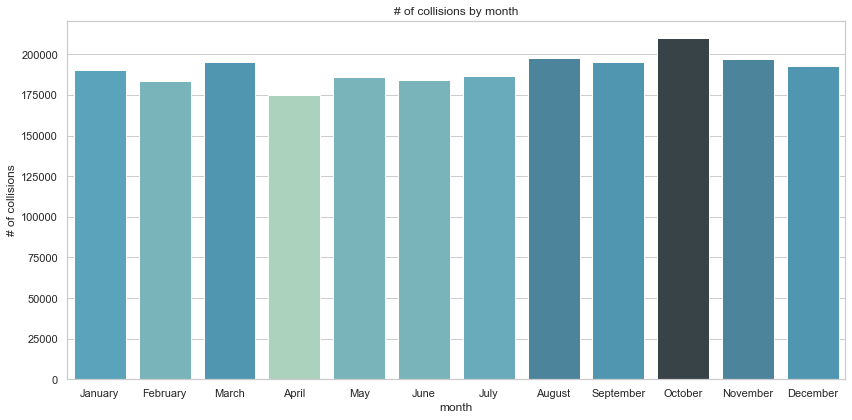

In [20]:
# plot collisions by month
fig, ax = plt.subplots(figsize =(12,6))

month_values = collision_months['COLLISION_DATE']
ax = sns.barplot(x=collision_months.index, y=month_values, 
            palette=colors_from_values(month_values, "GnBu_d"))

ax.title.set_text('# of collisions by month')
ax.set_ylabel('# of collisions')
ax.set_xlabel('month')
fig.tight_layout();

> **Observations:** Darker shades of green represent months with higher number of collisions

### 3. Collisions Severity By Day of Week *(countplot)*

In [21]:
# create a copy of collisions dataframe to change days text values
collisions_days = collisions_df.copy()

# replace column values with descriptive text
collisions_days['DAY_OF_WEEK'].replace(day_values, inplace=True)
collisions_days['COLLISION_SEVERITY'].replace(severity_values, inplace=True)
collisions_days['TYPE_OF_COLLISION'].replace(type_values, inplace=True)
collisions_days['PCF_VIOL_CATEGORY'].replace(pcf_values, inplace=True)
collisions_days['HIT_AND_RUN'].replace(hitrun_values, inplace=True)

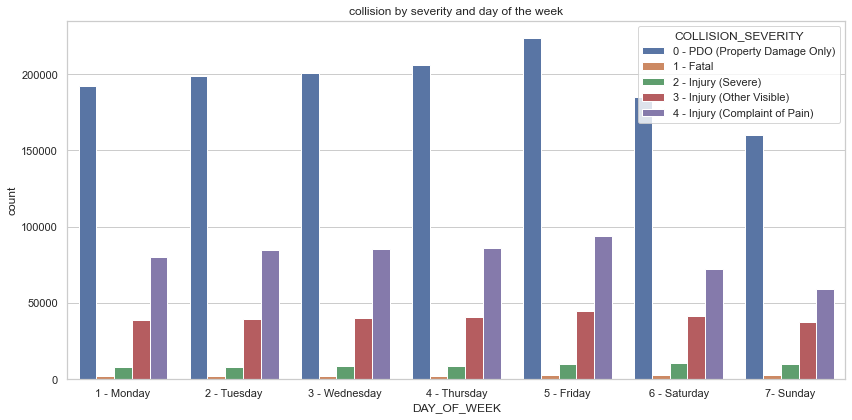

In [22]:
# plot a countplot collision severity levels, broken down by day of week
fig, ax = plt.subplots(figsize =(12,6))

ax = sns.countplot(x='DAY_OF_WEEK', hue='COLLISION_SEVERITY',
                 order=collisions_days['DAY_OF_WEEK'].value_counts().index.sort_values(),
                 hue_order=collisions_days['COLLISION_SEVERITY'].value_counts().index.sort_values(),
                 data=collisions_days)

ax.title.set_text('collision by severity and day of the week')
# sns.despine(offset=10, trim=True)
fig.tight_layout();

### 4. Type of Collision and Number of People Injured/Killed By Day of Week *(boxplot)*

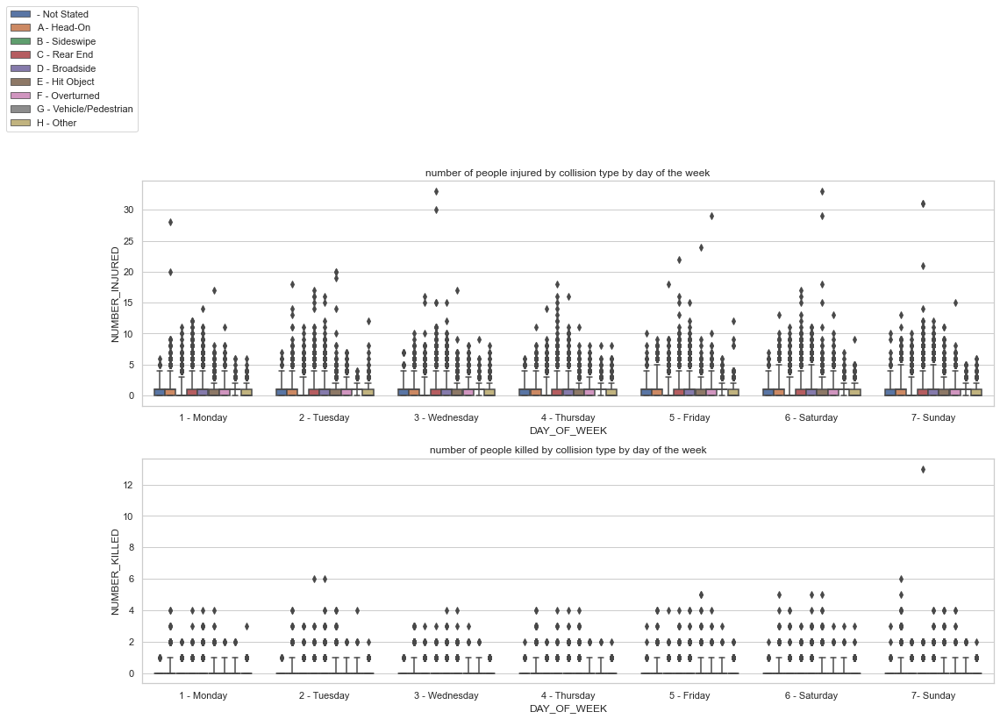

In [23]:
# plot a boxplot of type of collisions, broken down by day of week
fig, (ax1, ax2) = plt.subplots(2,1, figsize =(16,12))

ax1 = sns.boxplot(x='DAY_OF_WEEK', y='NUMBER_INJURED', hue='TYPE_OF_COLLISION', 
                  order=collisions_days['DAY_OF_WEEK'].value_counts().index.sort_values(),
                  hue_order=collisions_days['TYPE_OF_COLLISION'].value_counts().index.sort_values(),
                  data=collisions_days, whis=[0, 99], ax=ax1)
ax2 = sns.boxplot(x='DAY_OF_WEEK', y='NUMBER_KILLED', hue='TYPE_OF_COLLISION',
                  order=collisions_days['DAY_OF_WEEK'].value_counts().index.sort_values(),
                  hue_order=collisions_days['TYPE_OF_COLLISION'].value_counts().index.sort_values(),
                  data=collisions_days, whis=[0, 99], ax=ax2)

ax1.title.set_text('number of people injured by collision type by day of the week')
ax2.title.set_text('number of people killed by collision type by day of the week')
ax1.legend(bbox_to_anchor=(0,1.8))
ax2.get_legend().remove()
fig.tight_layout();

> **Observations:** There doesn't seem to be any noticeable variation in the distribution of injuries or deaths by day of the week, broken up by type of collision.

### 5. Violation Type By Day of Week *(countplot)*

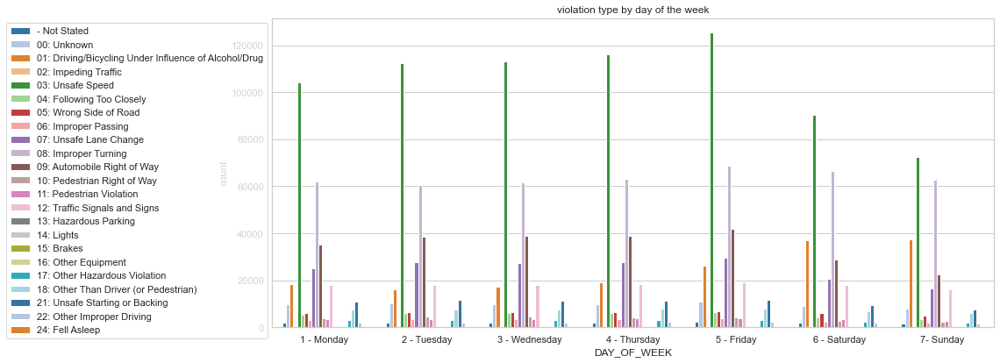

In [24]:
# plot a countplot of violation type by day of the week
fig, ax = plt.subplots(figsize =(16,6))

ax = sns.countplot(x='DAY_OF_WEEK', hue='PCF_VIOL_CATEGORY', 
                  order=collisions_days['DAY_OF_WEEK'].value_counts().index.sort_values(),
                  hue_order=collisions_days['PCF_VIOL_CATEGORY'].value_counts().index.sort_values(),
                  data=collisions_days, palette='tab20')

ax.title.set_text('violation type by day of the week')
ax.legend(bbox_to_anchor=(0,1))
fig.tight_layout();

### 6. Collisions by Time of Day *(barplot/lineplot - pareto diagram)*

In [25]:
# create a new column with the time of day (specifically, the hour) in which the collision occurred 
hour_digits = []
for idx, row in collisions_df.iterrows():
    i = row['COLLISION_TIME']
    try:
        # update shortened times with the correct formatting 
        if len(str(i)) == 1:
            i = f'0{i}00'
        elif((len(str(i)) == 2) & (i <= 23)):
            i = f'{i}00'
        elif((len(str(i)) == 2) & (i >= 25)):
            i = f'00{i}'
        elif(len(str(i)) == 3):
            i = f'0{i}'
        elif(i == 24):
            i = f'0000'
        elif(i==2500):
            i = f'0000'

        rounded_hour = pd.to_datetime(i, format='%H%M', errors='ignore').round('H').hour
        hour_digits.append(rounded_hour)
    except:
        continue

In [26]:
# create new column with the hour of the collision
collisions_df['COLLISION_HOUR'] = hour_digits

In [27]:
# view cases with incorrect COLLISION_TIME values
collisions_df[collisions_df['COLLISION_HOUR'].isna()]

,CASE_ID,ACCIDENT_YEAR,COLLISION_DATE,COLLISION_TIME,DAY_OF_WEEK,CNTY_CITY_LOC,PRIMARY_RD,SECONDARY_RD,WEATHER_1,WEATHER_2,COLLISION_SEVERITY,NUMBER_KILLED,NUMBER_INJURED,PARTY_COUNT,PCF_VIOL_CATEGORY,HIT_AND_RUN,TYPE_OF_COLLISION,MVIW,ROAD_COND_1,ROAD_COND_2,LIGHTING,ALCOHOL_INVOLVED,STWD_VEHTYPE_AT_FAULT,COUNT_PED_KILLED,COUNT_PED_INJURED,COUNT_BICYCLIST_KILLED,COUNT_BICYCLIST_INJURED,COUNT_MC_KILLED,COUNT_MC_INJURED,INTERSECTION,STATE_HWY_IND,DIRECTION,ROAD_SURFACE,TOW_AWAY,CONTROL_DEVICE,COLLISION_HOUR


In [28]:
# display labels and corresponding time windows
pd.DataFrame(data={'TIME' : ['00:00 to 04:00', '04:00 to 08:00', '08:00 to 11:00', '11:00 to 14:00', 
                             '14:00 to 18:00', '18:00 to 20:00', '20:00 to 00:00']},
             index=['Late Night', 'Early Morning','Morning','Noon', 'Afternoon', 'Evening','Night'])

,TIME
Late Night,00:00 to 04:00
Early Morning,04:00 to 08:00
Morning,08:00 to 11:00
Noon,11:00 to 14:00
Afternoon,14:00 to 18:00
Evening,18:00 to 20:00
Night,20:00 to 00:00


In [29]:
# categorize the COLLISION_TIME into time windows
b = [0,4,8,11,14,18,20,24]
l = ['Late Night', 'Early Morning','Morning','Noon','Afternoon','Evening','Night']
collisions_df['COLLISION_HOUR'] = pd.cut(collisions_df['COLLISION_HOUR'], bins=b, labels=l, include_lowest=True)

In [30]:
# create a dataframe to plot the data
collisions_time_df = pd.DataFrame(collisions_df.loc[:,['CASE_ID', 'COLLISION_TIME', 'COLLISION_HOUR']])

# create dataframe of collisions grouped by time of day
collisions_times = pd.DataFrame(collisions_time_df.groupby('COLLISION_HOUR')['CASE_ID'].count()).rename(columns={'CASE_ID':'COLLISIONS'})

# sort collisions by descending order
collisions_times = collisions_times.sort_values(by='COLLISIONS', ascending=False)

# create column with cumulative sum of collisions 
collisions_times['CUM_PCT'] = collisions_times['COLLISIONS'].cumsum()/collisions_times['COLLISIONS'].sum()*100

collisions_times

,COLLISIONS,CUM_PCT
COLLISION_HOUR,,
Afternoon,654266,28.511490
Noon,377428,44.958982
Early Morning,318014,58.817341
Morning,287316,71.337948
Night,223371,81.071971
Late Night,220498,90.680795
Evening,213852,100.000000


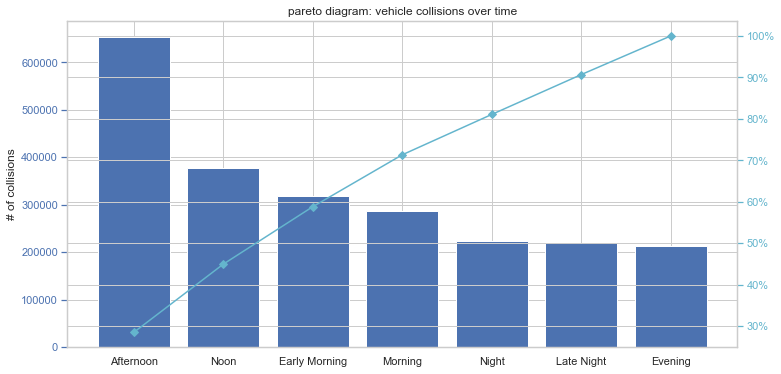

In [31]:
# create a pareto diagram of vehicle collisions over time of day
fig, ax = plt.subplots(figsize=(12,6))
ax2 = ax.twinx()

ax.bar(collisions_times.index, collisions_times['COLLISIONS'])
ax2.plot(collisions_times.index, collisions_times['CUM_PCT'], color='C9', marker='D')

ax.tick_params(axis='y', colors='C10') 
ax.set_ylabel('# of collisions')
ax2.yaxis.set_major_formatter(mpl.ticker.PercentFormatter())
ax2.tick_params(axis='y', colors='C9')
plt.title('pareto diagram: vehicle collisions over time')
plt.show();

> **Observations:** Almost 50% of the collisions appear to occur in the afternoon (between 2pm - 6pm) and noontime (between 11am - 2pm). This can possibly be due to the amount of people on the roads during the workday and especially when the workday ends for most people at 5pm. 60% of collisions occurred in the afternoon, noon time, or early morning hours (4am - 8am), which is also another time with heavy commute times as everyone's going into work.

### 7. Collision Severity Based on Time Window *(countplot)*

**Code Breakdown**
- 1 - Fatal
- 2 - Injury (Severe)
- 3 - Injury (Other Visible)
- 4 - Injury (Complaint of Pain)
- 0 - PDO (Property Damage Only)

COLLISION_SEVERITY,0,1,2,3,4
COLLISION_HOUR,,,,,
Late Night,150789,3470,8940,26797,30502
Early Morning,193909,2343,7800,36553,77409
Morning,168756,1407,6306,34925,75922
Noon,219037,1785,8784,47726,100096
Afternoon,377665,3270,16200,81408,175723
Evening,122338,2084,7597,27692,54141
Night,134630,2938,9038,28682,48083


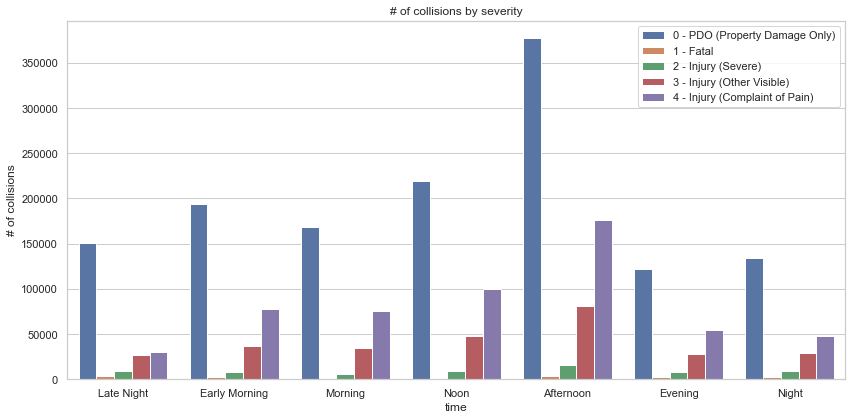

In [32]:
# examine collision severity broken down by time window
display(pd.crosstab(collisions_df['COLLISION_HOUR'],collisions_df['COLLISION_SEVERITY']))

# plot collision severity by time window
fig, ax = plt.subplots(figsize =(12,6))

# without renaming the column values, can manually update the legend names
ax = sns.countplot(x=collisions_df['COLLISION_HOUR'], hue=collisions_df['COLLISION_SEVERITY'], 
                   hue_order=[0,1,2,3,4])

ax.title.set_text('# of collisions by severity')
ax.set_ylabel('# of collisions')
ax.set_xlabel('time')
severity_labels = ['0 - PDO (Property Damage Only)', '1 - Fatal', '2 - Injury (Severe)', '3 - Injury (Other Visible)',
                   '4 - Injury (Complaint of Pain)']
ax.legend(severity_labels, bbox_to_anchor=(1,1))
fig.tight_layout();

### 8. Type of Vehicle Collision Based on Time Window *(countplot)*

**Code Breakdown**
- A - Head-On
- B - Sideswipe
- C - Rear End
- D - Broadside
- E - Hit Object
- F - Overturned
- G - Vehicle/Pedestrian
- H - Other
- \- - Not Stated

TYPE_OF_COLLISION,-,A,B,C,D,E,F,G,H
COLLISION_HOUR,,,,,,,,,
Late Night,1772,13991,42322,43223,19283,82060,8272,4428,5147
Early Morning,2235,13019,62085,109170,54520,52838,8043,9115,6989
Morning,2501,10501,59941,96772,58544,38038,6631,6660,7728
Noon,3286,14225,77916,128445,79501,47170,8660,7903,10322
Afternoon,5123,26067,123889,261992,124745,66751,12935,17459,15305
Evening,1859,11527,41942,66585,39686,31505,4869,9721,6158
Night,1984,13478,45950,56428,34945,49453,5857,9173,6103


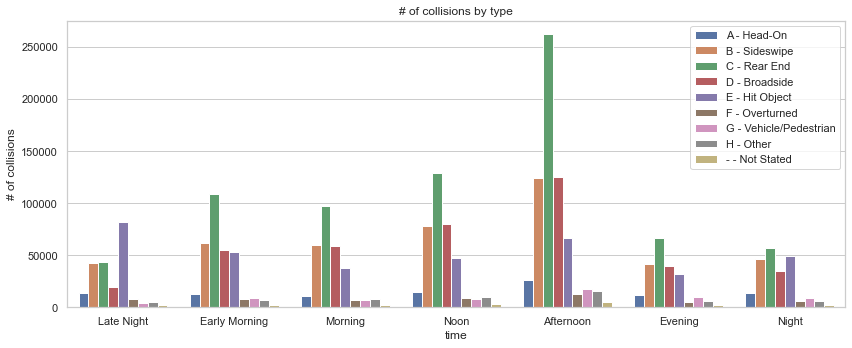

In [33]:
# examine type of vehicle collision broken down by time window
display(pd.crosstab(collisions_df['COLLISION_HOUR'],collisions_df['TYPE_OF_COLLISION']))

# plot collision type by time window
fig, ax = plt.subplots(figsize =(12,5))

# without renaming the column values, can manually update the legend names
ax = sns.countplot(x=collisions_df['COLLISION_HOUR'], hue=collisions_df['TYPE_OF_COLLISION'],
                   hue_order = ['A','B','C','D','E','F','G','H','-'])

ax.title.set_text('# of collisions by type')
ax.set_ylabel('# of collisions')
ax.set_xlabel('time')
type_labels = ['A - Head-On', 'B - Sideswipe', 'C - Rear End', 'D - Broadside', 'E - Hit Object', 
               'F - Overturned', 'G - Vehicle/Pedestrian', 'H - Other', '- - Not Stated']
ax.legend(type_labels)
fig.tight_layout();

> **Observations:** The distribution between the type of collision is pretty consistent between the time of day, except for late night (12am - 4am) - when there is a much higher case of collisions due to "Hit Object" - which makes sense, given reduced visibility and/or fatigue affecting drivers at night.

### 9. Other Party Vechicle Type Based on Time Window *(countplot)*

**Code Breakdown**
- A - Non-Collision
- B - Pedestrian
- C - Other Motor Vehicle
- D - Motor Vehicle on Other Roadway
- E - Parked Motor Vehicle
- F - Train
- G - Bicycle
- H - Animal
- I - Fixed Object
- J - Other Object
- \- - Not Stated

MVIW,-,A,B,C,D,E,F,G,H,I,J
COLLISION_HOUR,,,,,,,,,,,
Late Night,1121,6500,4609,70211,986,43912,60,1430,1548,81740,8381
Early Morning,1321,7837,9757,210479,2097,20736,100,6576,1974,50135,7002
Morning,1507,7260,7174,201669,2222,17898,86,7002,910,35439,6149
Noon,1890,9606,8551,271300,2889,21856,111,8915,698,43436,8176
Afternoon,2988,14101,18743,489410,4719,32478,158,16871,1630,63319,9849
Evening,1042,4840,10466,136919,1565,17399,55,5734,1638,29561,4633
Night,1146,5357,9835,118110,1505,27605,60,3900,2197,46772,6884


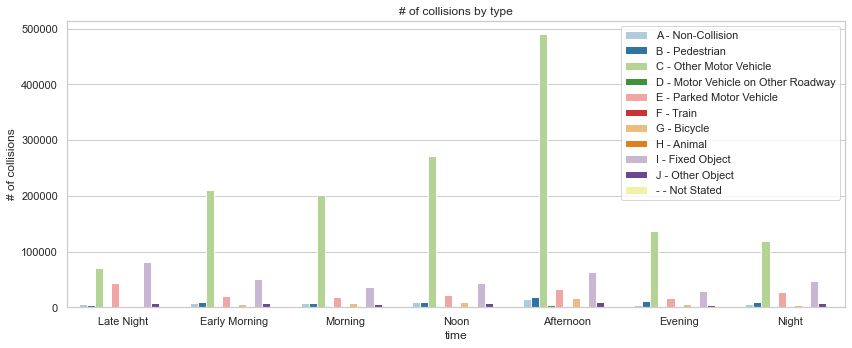

In [34]:
# examine what the motor vehicle was involved with, broken down by time window
display(pd.crosstab(collisions_df['COLLISION_HOUR'],collisions_df['MVIW']))

# plot party type by time window
fig, ax = plt.subplots(figsize =(12,5))

# without renaming the column values, can manually update the legend names
ax = sns.countplot(x=collisions_df['COLLISION_HOUR'], hue=collisions_df['MVIW'],
                   hue_order = ['A','B','C','D','E','F','G','H','I','J','-'], palette='Paired')

ax.title.set_text('# of collisions by type')
ax.set_ylabel('# of collisions')
ax.set_xlabel('time')
other_labels = ['A - Non-Collision', 'B - Pedestrian', 'C - Other Motor Vehicle', 'D - Motor Vehicle on Other Roadway',
                'E - Parked Motor Vehicle', 'F - Train', 'G - Bicycle', 'H - Animal', 'I - Fixed Object',
                'J - Other Object', '- - Not Stated']
ax.legend(other_labels)
fig.tight_layout();

### 10. Collisions Based on Holidays and Time Window *(countplot)*

In [35]:
# set the time frame from the column and initiate a calendar object 
time_frame = collisions_df.COLLISION_DATE
cal = calendar()

# determine the holidays in the data time period
holidays = cal.holidays(start=time_frame.min(), end=time_frame.max())

# create a new column that determines if collision occured during a holiday
collisions_df['HOLIDAY'] = time_frame.isin(holidays)

HOLIDAY,False,True
COLLISION_HOUR,,
Late Night,213693,6805
Early Morning,312805,5209
Morning,281729,5587
Noon,368782,8646
Afternoon,641308,12958
Evening,208767,5085
Night,217591,5780


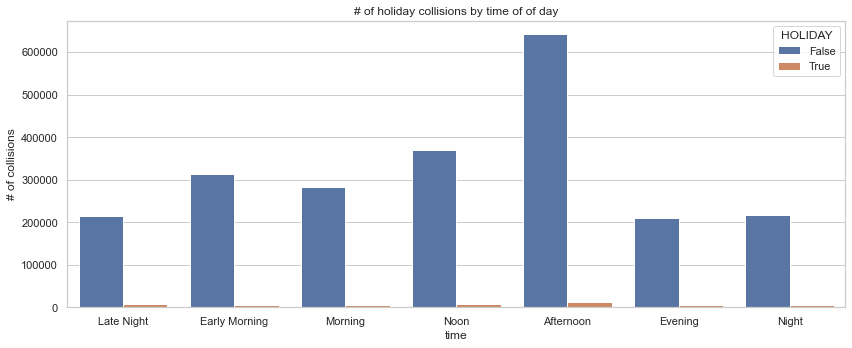

In [36]:
# examine whether the collision occured on a holiday and during which time window
display(pd.crosstab(collisions_df['COLLISION_HOUR'],collisions_df['HOLIDAY']))

# plot holiday determination by time window
fig, ax = plt.subplots(figsize =(12,5))

ax = sns.countplot(x=collisions_df['COLLISION_HOUR'], hue=collisions_df['HOLIDAY'])

ax.title.set_text('# of holiday collisions by time of of day')
ax.set_ylabel('# of collisions')
ax.set_xlabel('time')

fig.tight_layout();

> **Observations:** Whether it's a holiday or not, the collisions seem consistently higher in the afternoon.

### 11. Hit and Run by Time Window *(countplot)*

HIT_AND_RUN,F,M,N
COLLISION_HOUR,,,
Late Night,8033,72280,140185
Early Morning,7605,48177,262232
Morning,6446,39461,241409
Noon,9451,56053,311924
Afternoon,19215,105126,529925
Evening,9141,44774,159937
Night,11133,55960,156278


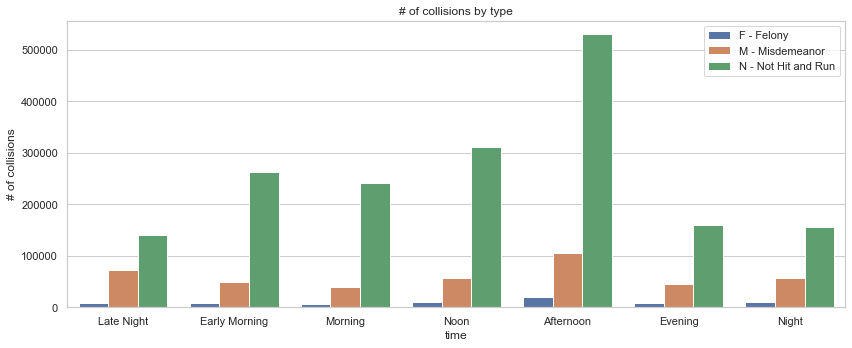

In [37]:
# examine if a hit and run occurred, broken down by time window
display(pd.crosstab(collisions_df['COLLISION_HOUR'],collisions_df['HIT_AND_RUN']))

# plot results by time window
fig, ax = plt.subplots(figsize =(12,5))

# without renaming the column values, can manually update the legend names
ax = sns.countplot(x=collisions_df['COLLISION_HOUR'], hue=collisions_df['HIT_AND_RUN'], hue_order = ['F','M','N'])

ax.title.set_text('# of collisions by type')
ax.set_ylabel('# of collisions')
ax.set_xlabel('time')
hitrun_labels = ['F - Felony', 'M - Misdemeanor', 'N - Not Hit and Run']
ax.legend(hitrun_labels)
fig.tight_layout();

> **Observations:** Given most accidents occur in the afternoon, most hit and run incidents occur in the afternoon as well. However, there is also a noticeably higher occurance of hit and run incidents late at night, which might point to more people willing to commit a crime when there is less visibility.

### 12. Similarly, Hit and Run and Collision Severity *(displot: histogram)*

COLLISION_SEVERITY,0 - PDO (Property Damage Only),1 - Fatal,2 - Injury (Severe),3 - Injury (Other Visible),4 - Injury (Complaint of Pain)
HIT_AND_RUN,,,,,
F - Felony,1462,1798,6232,19578,41954
M - Misdemeanor,390173,30,654,8107,22867
N - Not Hit and Run,975489,15469,57779,256098,497055


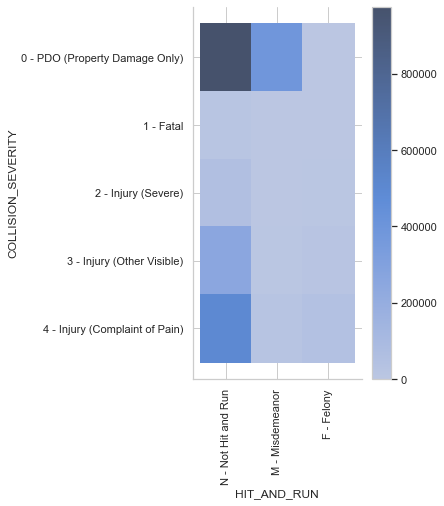

In [38]:
# examine hit and run stats and resulting collision severity using previously created dataframe
display(pd.crosstab(collisions_days['HIT_AND_RUN'],collisions_days['COLLISION_SEVERITY']))

ax = sns.displot(collisions_days, x='HIT_AND_RUN', y='COLLISION_SEVERITY', height=6, cbar=True)
plt.xticks(rotation=90)
plt.show();

### 13. PCF Violation Category by Time Window *(barplot - stacked percentage)*

In [39]:
# create a copy of collisions dataframe to change violations text values
pcf_pct = collisions_df[['COLLISION_HOUR', 'PCF_VIOL_CATEGORY']].copy()

# replace column values with descriptive text
pcf_pct.replace(pcf_values, inplace=True)

PCF_VIOL_CATEGORY,- Not Stated,00: Unknown,01: Driving/Bicycling Under Influence of Alcohol/Drug,02: Impeding Traffic,03: Unsafe Speed,04: Following Too Closely,05: Wrong Side of Road,06: Improper Passing,07: Unsafe Lane Change,08: Improper Turning,09: Automobile Right of Way,10: Pedestrian Right of Way,11: Pedestrian Violation,12: Traffic Signals and Signs,13: Hazardous Parking,14: Lights,15: Brakes,16: Other Equipment,17: Other Hazardous Violation,18: Other Than Driver (or Pedestrian),21: Unsafe Starting or Backing,22: Other Improper Driving,24: Fell Asleep
COLLISION_HOUR,,,,,,,,,,,,,,,,,,,,,,,
Late Night,0.727898,3.263522,24.211104,0.037189,20.767535,0.387305,1.636750,0.264855,4.407296,31.436566,2.185961,0.337418,1.059874,3.374634,0.159185,0.009524,0.015420,0.069842,0.381409,2.502517,2.102513,0.657149,0.004535
Early Morning,0.514757,2.772834,3.549844,0.057230,35.127384,1.518801,1.952115,1.023854,8.756533,20.388725,10.192319,1.484526,0.839900,5.347249,0.087732,0.009434,0.010377,0.113203,0.750910,2.443918,2.554919,0.499664,0.003773
Morning,0.682176,3.015843,2.177742,0.071002,33.151652,1.860321,1.814379,1.129070,8.625346,18.413524,11.801988,1.219215,0.537387,6.879533,0.129126,0.001044,0.015314,0.164975,1.113408,2.397708,4.082613,0.715936,0.000696
Noon,0.655224,3.014615,2.643153,0.055640,32.499179,1.956135,1.948451,1.145384,8.270717,18.203737,13.191655,0.917791,0.631114,6.059169,0.114724,0.001325,0.022256,0.157116,1.150948,2.333690,4.284261,0.743453,0.000265
Afternoon,0.556807,2.741545,4.506577,0.052731,37.180749,2.104649,1.868659,1.092369,7.724381,15.746348,12.831937,1.175821,0.952212,4.868968,0.098278,0.008712,0.013603,0.100876,0.869371,1.681121,3.244093,0.579275,0.000917
Evening,0.620523,3.024054,10.312740,0.054243,28.842845,1.580532,1.976133,0.771094,7.019340,18.181266,11.000599,1.712867,2.034117,5.912968,0.128126,0.031330,0.014964,0.086976,0.862746,2.391841,2.851505,0.588725,0.000468
Night,0.668395,3.072467,17.462428,0.057304,23.792256,0.930291,1.875803,0.551549,6.628434,21.413702,7.229229,1.148314,2.130089,6.064798,0.158033,0.036263,0.018803,0.077002,0.728385,2.914882,2.463167,0.577067,0.001343


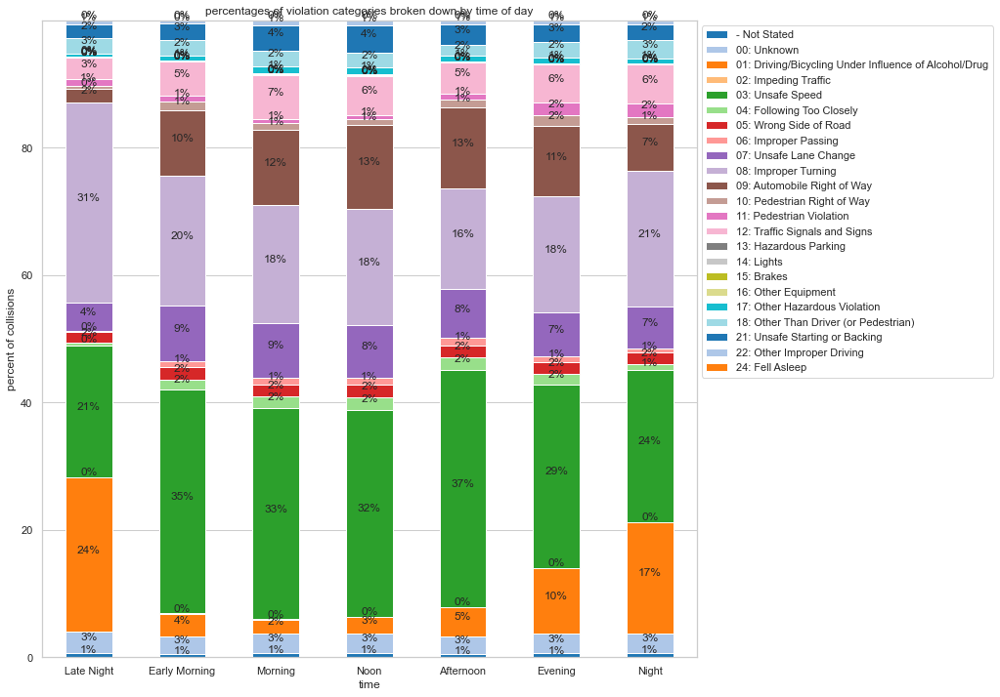

In [40]:
# examine the percent stacked bar graph of violations broken down by time of day
ax = pd.crosstab(pcf_pct['COLLISION_HOUR'],pcf_pct['PCF_VIOL_CATEGORY']).apply(lambda r: r/r.sum()*100, axis=1)
display(ax)

ax_1 = ax.plot.bar(figsize=(12,12),stacked=True, 
                   colormap=ListedColormap(
                   sns.color_palette('tab20', len(pcf_pct['PCF_VIOL_CATEGORY'].value_counts()))))

plt.title('percentages of violation categories broken down by time of day')
plt.legend(bbox_to_anchor=(1,1))
plt.xticks(rotation=0)
plt.xlabel('time')
plt.ylabel('percent of collisions')

# display percentages for each component of the stacked bars
for rec in ax_1.patches:
    height = rec.get_height()
    ax_1.text(rec.get_x() + rec.get_width() / 2, 
              rec.get_y() + height / 2,
              '{:.0f}%'.format(height),
              ha='center', 
              va='bottom')
plt.show();

PCF_VIOL_CATEGORY,03: Unsafe Speed,04: Following Too Closely,06: Improper Passing,07: Unsafe Lane Change,12: Traffic Signals and Signs
COLLISION_HOUR,,,,,
Late Night,71.117738,1.326314,0.906987,15.092640,11.556322
Early Morning,67.847772,2.933531,1.977552,16.913051,10.328094
Morning,64.190259,3.602068,2.186175,16.700924,13.320574
Noon,65.088723,3.917708,2.293953,16.564430,12.135186
Afternoon,70.190610,3.973200,2.062198,14.582251,9.191741
Evening,65.363584,3.581799,1.747451,15.907212,13.399953
Night,62.665079,2.450241,1.452693,17.458259,15.973729


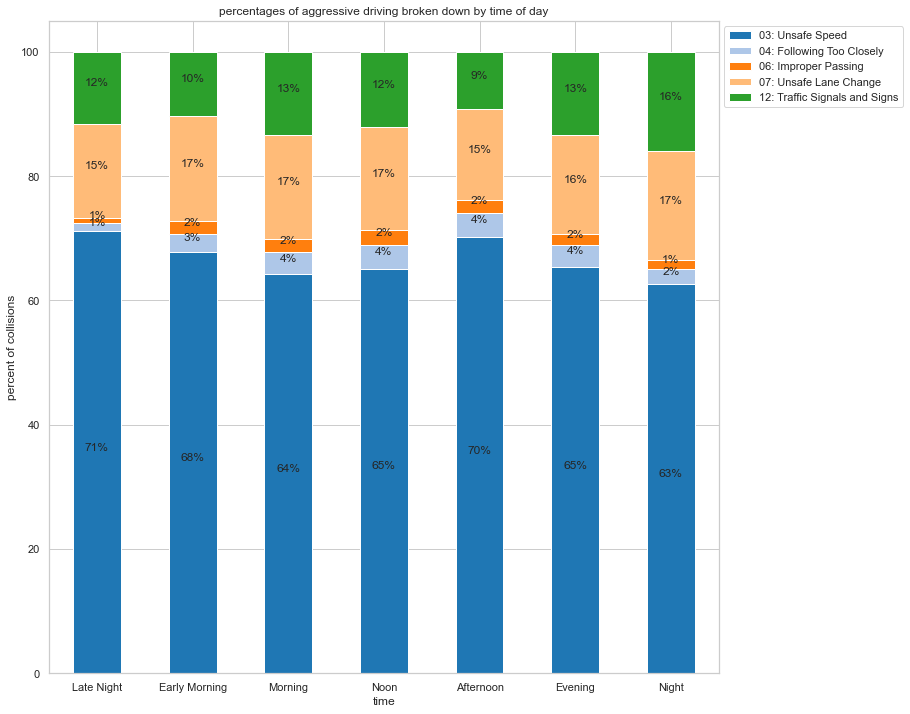

In [41]:
# create sliced dataframe for collision factors that point to aggressive driving 
mask = ((pcf_pct['PCF_VIOL_CATEGORY'] == '03: Unsafe Speed') | 
        (pcf_pct['PCF_VIOL_CATEGORY'] == '04: Following Too Closely') |
        (pcf_pct['PCF_VIOL_CATEGORY'] == '06: Improper Passing') |
        (pcf_pct['PCF_VIOL_CATEGORY'] == '07: Unsafe Lane Change') |
        (pcf_pct['PCF_VIOL_CATEGORY'] == '12: Traffic Signals and Signs'))
                
agg_pcf_pct = pcf_pct[mask].copy()

# examine the percent stacked bar graph of aggressive driving broken down by time of day
ax = pd.crosstab(agg_pcf_pct['COLLISION_HOUR'],agg_pcf_pct['PCF_VIOL_CATEGORY']).apply(lambda r: r/r.sum()*100, axis=1)
display(ax)

ax_1 = ax.plot.bar(figsize=(12,12),stacked=True, 
                   colormap=ListedColormap(
                   sns.color_palette('tab20', len(agg_pcf_pct['PCF_VIOL_CATEGORY'].value_counts()))))

plt.title('percentages of aggressive driving broken down by time of day')
plt.legend(bbox_to_anchor=(1,1))
plt.xticks(rotation=0)
plt.xlabel('time')
plt.ylabel('percent of collisions')

# display percentages for each component of the stacked bars
for rec in ax_1.patches:
    height = rec.get_height()
    ax_1.text(rec.get_x() + rec.get_width() / 2, 
              rec.get_y() + height / 2,
              '{:.0f}%'.format(height),
              ha='center', 
              va='bottom')
plt.show();

## Conditions Statistics

### 14. Collision Severity Based on Lighting *(countplot)*

In [42]:
# examine to see if lighting logically corresponds to time of day
pd.crosstab(collisions_df['COLLISION_HOUR'],collisions_df['LIGHTING'])

LIGHTING,-,A,B,C,D,E
COLLISION_HOUR,,,,,,
Late Night,1124,12103,1886,141230,63066,1089
Early Morning,954,223860,31225,36895,24605,475
Morning,1112,279645,542,4313,1534,170
Noon,1290,372326,405,2485,726,196
Afternoon,1946,534997,28372,63678,24559,714
Evening,681,54912,20667,102965,33963,664
Night,674,4370,2179,158615,56326,1207


In [43]:
# create a copy of collisions dataframe to change lighting text values
lighting_df = collisions_df.copy()

# replace column values with descriptive text
lighting_df['LIGHTING'].replace(light_values, inplace=True)
lighting_df['COLLISION_SEVERITY'].replace(severity_values, inplace=True)
lighting_df['PCF_VIOL_CATEGORY'].replace(pcf_values, inplace=True)

COLLISION_SEVERITY,0 - PDO (Property Damage Only),1 - Fatal,2 - Injury (Severe),3 - Injury (Other Visible),4 - Injury (Complaint of Pain)
LIGHTING,,,,,
- Not Stated,4669,35,173,953,1951
A - Daylight,866657,6792,34354,184892,389518
B - Dusk - Dawn,50622,829,2701,10333,20791
C - Dark - Street Lights,310040,5424,17521,62119,115077
D - Dark - No Street Lights,132404,4104,9725,24975,33571
E - Dark - Street Lights Not Functioning,2732,113,191,511,968


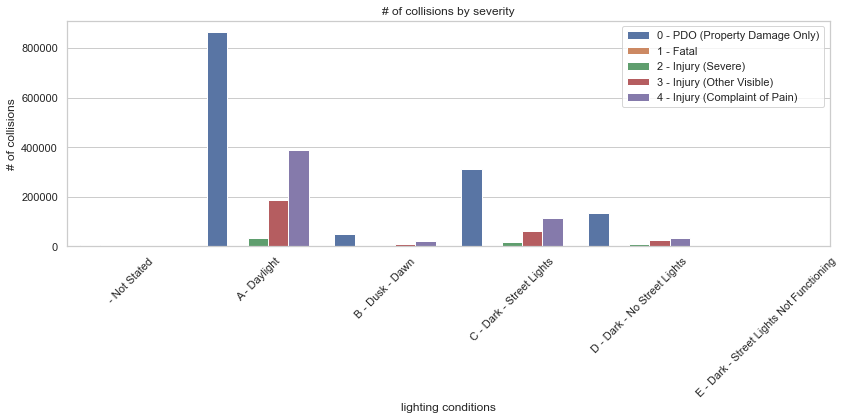

In [44]:
# examine collision severity broken down by time window
display(pd.crosstab(lighting_df['LIGHTING'],lighting_df['COLLISION_SEVERITY']))

# plot collision severity by lighting conditions
fig, ax = plt.subplots(figsize =(12,6))

ax = sns.countplot(x=lighting_df['LIGHTING'], hue=lighting_df['COLLISION_SEVERITY'],
                   order=lighting_df['LIGHTING'].value_counts().index.sort_values(),
                   hue_order=lighting_df['COLLISION_SEVERITY'].value_counts().index.sort_values())

ax.title.set_text('# of collisions by severity')
ax.set_ylabel('# of collisions')
ax.set_xlabel('lighting conditions')
ax.set_xticklabels(ax.get_xticklabels(),rotation=45)
ax.legend(bbox_to_anchor=(1,1))
fig.tight_layout();

> **Observations:** This data is inline with earlier observations that most collisions happen while there is still daylight and most collisions are property damage only.

### 15. Violation Category Based on Lighting *(heatmap)*

PCF_VIOL_CATEGORY,- Not Stated,00: Unknown,01: Driving/Bicycling Under Influence of Alcohol/Drug,02: Impeding Traffic,03: Unsafe Speed,04: Following Too Closely,05: Wrong Side of Road,06: Improper Passing,07: Unsafe Lane Change,08: Improper Turning,09: Automobile Right of Way,10: Pedestrian Right of Way,11: Pedestrian Violation,12: Traffic Signals and Signs,13: Hazardous Parking,14: Lights,15: Brakes,16: Other Equipment,17: Other Hazardous Violation,18: Other Than Driver (or Pedestrian),21: Unsafe Starting or Backing,22: Other Improper Driving,24: Fell Asleep
LIGHTING,,,,,,,,,,,,,,,,,,,,,,,
- Not Stated,407,1029,375,6,1433,150,152,55,219,1529,970,165,91,560,12,3,2,12,75,62,357,117,0
A - Daylight,8811,41919,48075,822,514031,29191,28005,16878,121767,260670,186424,16816,9968,85963,1594,14,242,1971,14581,29675,55188,9593,15
B - Dusk - Dawn,539,2796,5589,43,26650,1297,1907,784,6287,17651,9355,1223,925,4671,92,9,6,83,660,1874,2256,575,4
C - Dark - Street Lights,3953,18523,83652,244,131108,6079,8979,2547,30529,104649,42302,7672,10411,31543,729,154,88,280,3593,6999,12855,3279,13
D - Dark - No Street Lights,407,2900,33264,152,58968,889,3927,1150,14773,60043,5076,414,2719,2228,272,82,20,252,993,12850,2743,655,2
E - Dark - Street Lights Not Functioning,21,157,497,0,1310,34,56,21,343,961,432,63,158,164,5,2,0,1,30,152,87,20,1


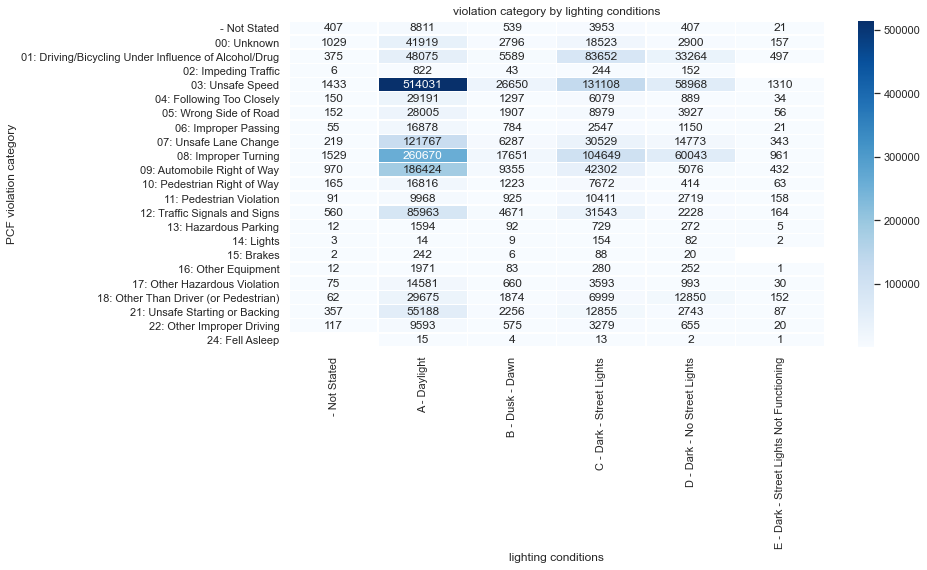

In [45]:
# examine different PCF violation categories based on lighting conditions
display(pd.crosstab(lighting_df['LIGHTING'],lighting_df['PCF_VIOL_CATEGORY']))

# plot violation category by lighting conditions
f, ax = plt.subplots(figsize=(12, 6))

lighting_heatmap_df = pd.DataFrame(lighting_df.groupby(['LIGHTING','PCF_VIOL_CATEGORY'])['CASE_ID'].count())
lighting_heatmap_df.reset_index(inplace=True)
lighting_heatmap = lighting_heatmap_df.pivot(index='PCF_VIOL_CATEGORY', columns='LIGHTING', values='CASE_ID')

ax = sns.heatmap(lighting_heatmap, annot=True, fmt='.0f', linewidths=.5, cmap='Blues', ax=ax)

ax.title.set_text('violation category by lighting conditions')
ax.set_ylabel('PCF violation category')
ax.set_xlabel('lighting conditions')
fig.tight_layout();

> **Observations:** This visualization shows most accidents that occur during daylight are due to unsafe speeds, followed by improper turning. The data does show the highest number of collisions of "Driving/Bicycling Under Influence of Alcohol/Drug" occurs during dark, regardless of whether street lights are present are not.

### 16. Collision Severity Based on Weather *(countplot)*

In [46]:
# create a copy of collisions dataframe to change lighting text values
weather_df = collisions_df.copy()

# replace column values with descriptive text
weather_df['WEATHER_1'].replace(weather_values, inplace=True)
weather_df['WEATHER_2'].replace(weather_values, inplace=True)
weather_df['COLLISION_SEVERITY'].replace(severity_values, inplace=True)
weather_df['ROAD_COND_1'].replace(road_values, inplace=True)
weather_df['ROAD_COND_2'].replace(road_values, inplace=True)
weather_df['ROAD_SURFACE'].replace(surface_values, inplace=True)
weather_df['PCF_VIOL_CATEGORY'].replace(pcf_values, inplace=True)

COLLISION_SEVERITY,0 - PDO (Property Damage Only),1 - Fatal,2 - Injury (Severe),3 - Injury (Other Visible),4 - Injury (Complaint of Pain)
WEATHER_1,,,,,
- Not Stated,3362,26,169,790,1608
A - Clear,1151598,14501,55855,244686,477360
B - Cloudy,157686,2192,6448,29155,61912
C - Raining,46281,428,1715,7685,18608
D - Snowing,1675,13,65,231,317
E - Fog,3867,93,292,810,1344
F - Other,1989,29,84,283,499
G - Wind,666,15,37,143,228


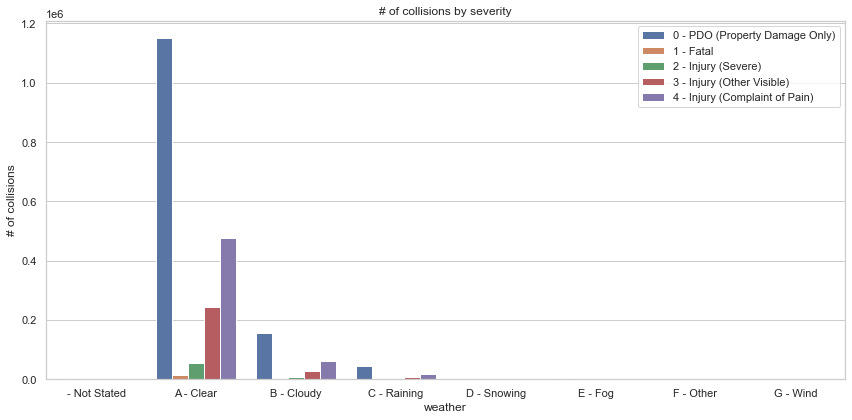

In [47]:
# examine collision severity broken down by weather
display(pd.crosstab(weather_df['WEATHER_1'],weather_df['COLLISION_SEVERITY']))

# plot collision severity by time window
fig, ax = plt.subplots(figsize =(12,6))

ax = sns.countplot(x=weather_df['WEATHER_1'], hue=weather_df['COLLISION_SEVERITY'],
                   order=weather_df['WEATHER_1'].value_counts().index.sort_values(),
                   hue_order=weather_df['COLLISION_SEVERITY'].value_counts().index.sort_values())

ax.title.set_text('# of collisions by severity')
ax.set_ylabel('# of collisions')
ax.set_xlabel('weather')
ax.legend(bbox_to_anchor=(1,1))
fig.tight_layout();

> **Observations:** Inclement weather does not seem to noticeably factor into whether a collision will occur.

### 17. PCF Violation Category Based on Weather *(barplot - stacked percentage/heatmap)*

PCF_VIOL_CATEGORY,- Not Stated,00: Unknown,01: Driving/Bicycling Under Influence of Alcohol/Drug,02: Impeding Traffic,03: Unsafe Speed,04: Following Too Closely,05: Wrong Side of Road,06: Improper Passing,07: Unsafe Lane Change,08: Improper Turning,09: Automobile Right of Way,10: Pedestrian Right of Way,11: Pedestrian Violation,12: Traffic Signals and Signs,13: Hazardous Parking,14: Lights,15: Brakes,16: Other Equipment,17: Other Hazardous Violation,18: Other Than Driver (or Pedestrian),21: Unsafe Starting or Backing,22: Other Improper Driving,24: Fell Asleep
WEATHER_1,,,,,,,,,,,,,,,,,,,,,,,
- Not Stated,6.280437,11.989924,7.808564,0.067170,16.691856,1.847187,2.686818,0.873216,3.610411,16.372796,11.922754,2.384551,1.595298,8.010076,0.151134,0.016793,0.016793,0.067170,0.890008,0.856423,3.862301,1.981528,0.016793
A - Clear,0.631327,3.006790,7.570525,0.055761,31.019650,1.697325,1.914506,0.973148,7.685751,19.220730,11.029784,1.161317,1.083076,5.619650,0.122274,0.012037,0.016307,0.117593,0.900103,2.217593,3.307716,0.635391,0.001646
B - Cloudy,0.346552,2.112334,6.756594,0.054780,36.976919,1.366393,1.648452,0.793339,7.944272,20.408869,8.746547,0.829082,0.834910,4.293823,0.097128,0.007770,0.011655,0.102178,0.742833,2.597196,2.810488,0.517108,0.000777
C - Raining,0.610303,2.757070,7.386539,0.044167,39.656303,1.246035,1.541818,0.433636,4.534443,21.051434,8.101235,1.853661,1.159040,5.064443,0.073611,0.009369,0.010707,0.044167,0.491187,1.580631,1.920580,0.429621,0.000000
D - Snowing,0.391134,2.694481,3.129074,0.000000,67.622773,0.304216,2.129509,0.738809,0.782269,10.995219,1.216862,0.043459,0.347675,0.912647,0.086919,0.000000,0.043459,0.043459,1.129944,3.780965,1.390700,2.216428,0.000000
E - Fog,0.499532,2.466438,9.787699,0.062441,32.547612,0.780518,2.201062,0.764908,3.918202,22.853575,9.132064,0.827349,1.030284,6.150484,0.109273,0.031221,0.000000,0.078052,0.530752,4.043085,1.795192,0.390259,0.000000
F - Other,3.120666,14.285714,4.542302,0.000000,26.733703,0.762829,1.803051,0.832178,4.542302,23.509015,5.166436,1.803051,0.797503,3.328710,0.069348,0.000000,0.034674,0.138696,0.693481,2.565881,4.091540,1.178918,0.000000
G - Wind,1.101928,2.662994,6.978880,0.091827,24.426079,0.642792,1.010101,0.826446,5.142332,20.385675,9.366391,0.918274,0.918274,5.417815,0.183655,0.000000,0.000000,0.275482,2.020202,15.151515,1.836547,0.642792,0.000000


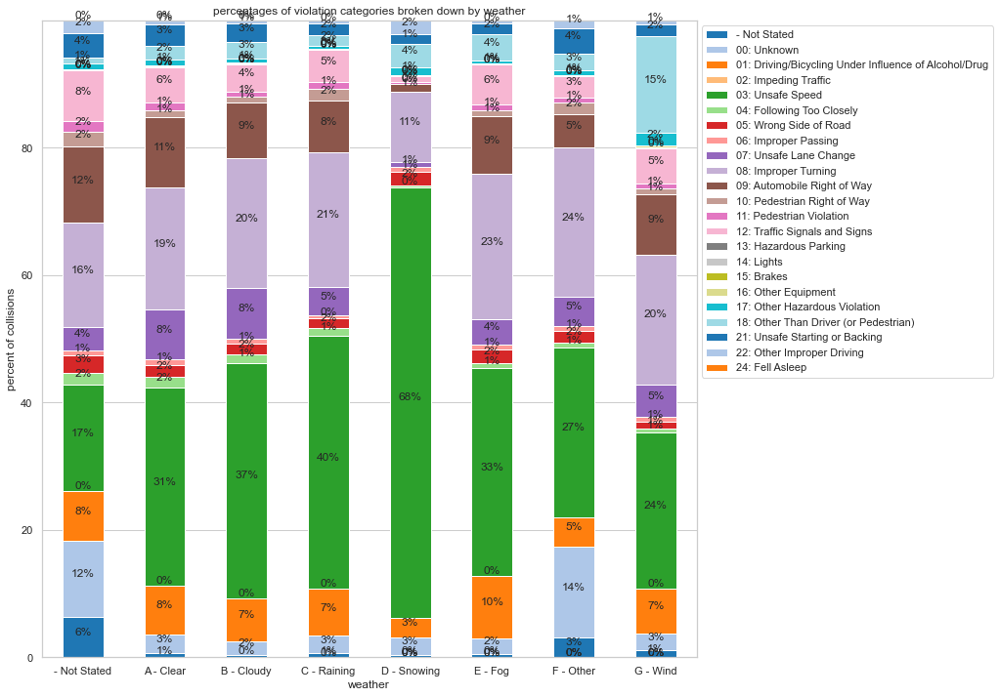

In [48]:
# examine the percent stacked bar graph of violations broken down by weather
ax = pd.crosstab(weather_df['WEATHER_1'],weather_df['PCF_VIOL_CATEGORY']).apply(lambda r: r/r.sum()*100, axis=1)
display(ax)

ax_1 = ax.plot.bar(figsize=(12,12),stacked=True, 
                   colormap=ListedColormap(
                   sns.color_palette('tab20', len(pcf_pct['PCF_VIOL_CATEGORY'].value_counts()))))

plt.title('percentages of violation categories broken down by weather')
plt.legend(bbox_to_anchor=(1,1))
plt.xticks(rotation=0)
plt.xlabel('weather')
plt.ylabel('percent of collisions')

# display percentages for each component of the stacked bars
for rec in ax_1.patches:
    height = rec.get_height()
    ax_1.text(rec.get_x() + rec.get_width() / 2, 
              rec.get_y() + height / 2,
              '{:.0f}%'.format(height),
              ha='center', 
              va='bottom')
plt.show();

> **Observations:** There seems to be more collisions that occur due to unsafe speeds in inclement weather such as rain or snow.

PCF_VIOL_CATEGORY,- Not Stated,00: Unknown,01: Driving/Bicycling Under Influence of Alcohol/Drug,02: Impeding Traffic,03: Unsafe Speed,04: Following Too Closely,05: Wrong Side of Road,06: Improper Passing,07: Unsafe Lane Change,08: Improper Turning,09: Automobile Right of Way,10: Pedestrian Right of Way,11: Pedestrian Violation,12: Traffic Signals and Signs,13: Hazardous Parking,14: Lights,15: Brakes,16: Other Equipment,17: Other Hazardous Violation,18: Other Than Driver (or Pedestrian),21: Unsafe Starting or Backing,22: Other Improper Driving,24: Fell Asleep
WEATHER_2,,,,,,,,,,,,,,,,,,,,,,,
- Not Stated,13943,66241,167696,1233,704559,37019,42088,21120,170027,432000,240243,25801,23834,123038,2646,255,352,2533,19505,49908,72282,13965,34
B - Cloudy,32,166,336,6,1960,87,98,51,582,1073,609,48,58,291,6,0,2,9,74,139,196,36,0
C - Raining,117,706,2702,23,23406,443,628,209,2859,10564,2931,404,286,1408,41,5,4,35,200,842,827,165,1
D - Snowing,2,15,57,2,936,4,30,8,15,212,30,3,3,11,0,0,0,2,18,48,28,29,0
E - Fog,5,25,122,0,514,13,40,10,56,332,132,9,14,54,5,1,0,1,7,59,24,7,0
F - Other,5,33,83,1,528,13,32,6,29,194,89,32,22,63,0,1,0,0,5,36,20,8,0
G - Wind,34,138,456,2,1597,61,110,31,350,1128,525,56,55,264,6,2,0,19,123,580,109,29,0


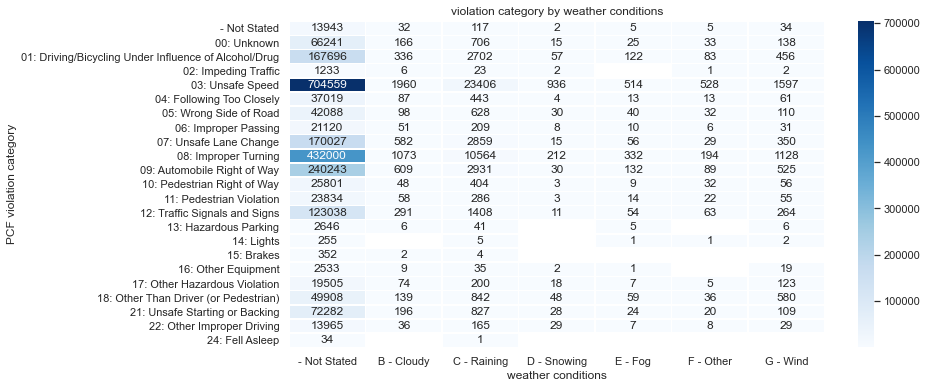

In [49]:
# examine different PCF violation categories based on weather conditions
display(pd.crosstab(weather_df['WEATHER_2'],weather_df['PCF_VIOL_CATEGORY']))

# plot violation category by weather conditions
f, ax = plt.subplots(figsize=(12, 6))

weather_heatmap_df = pd.DataFrame(weather_df.groupby(['WEATHER_2','PCF_VIOL_CATEGORY'])['CASE_ID'].count())
weather_heatmap_df.reset_index(inplace=True)
weather_heatmap = weather_heatmap_df.pivot(index='PCF_VIOL_CATEGORY', columns='WEATHER_2', values='CASE_ID')

ax = sns.heatmap(weather_heatmap, annot=True, linewidths=.5, fmt='.0f', cmap='Blues', ax=ax)

ax.title.set_text('violation category by weather conditions')
ax.set_ylabel('PCF violation category')
ax.set_xlabel('weather conditions')
fig.tight_layout();

### 18. Collision Severity Based on Road Conditions *(jointplot - histogram/countplot)*

COLLISION_SEVERITY,0 - PDO (Property Damage Only),1 - Fatal,2 - Injury (Severe),3 - Injury (Other Visible),4 - Injury (Complaint of Pain)
ROAD_COND_1,,,,,
- Not Stated,6091,46,360,1741,3900
"A - Holes, Deep Ruts",3070,41,233,904,1337
B - Loose Material on Roadway,2106,42,232,660,568
C - Obstruction on Roadway,5310,74,208,722,1299
D - Construction or Repair Zone,25314,272,843,3544,8311
E - Reduced Roadway Width,1595,14,47,210,287
F - Flooded,1091,17,43,169,425
G - Other,3774,69,348,1059,1469
H - No Unusual Condition,1318773,16722,62351,274774,544280


COLLISION_SEVERITY,0 - PDO (Property Damage Only),1 - Fatal,2 - Injury (Severe),3 - Injury (Other Visible),4 - Injury (Complaint of Pain)
ROAD_COND_2,,,,,
- Not Stated,1358726,17206,64347,282607,559320
B - Loose Material on Roadway,80,5,15,31,25
C - Obstruction on Roadway,67,2,4,11,25
D - Construction or Repair Zone,516,3,28,100,126
E - Reduced Roadway Width,4900,39,127,509,1315
F - Flooded,42,2,3,9,10
G - Other,234,9,22,54,69
H - No Unusual Condition,2559,31,119,462,986


COLLISION_SEVERITY,0 - PDO (Property Damage Only),1 - Fatal,2 - Injury (Severe),3 - Injury (Other Visible),4 - Injury (Complaint of Pain)
ROAD_SURFACE,,,,,
- Not Stated,7374,67,362,1831,3699
A - Dry,1242375,15894,59683,262108,513386
B - Wet,111686,1275,4321,18730,43374
C - Snowy or Icy,4860,52,220,825,1102
"D - Slippery (Muddy, Oily, etc.)",829,9,79,289,315


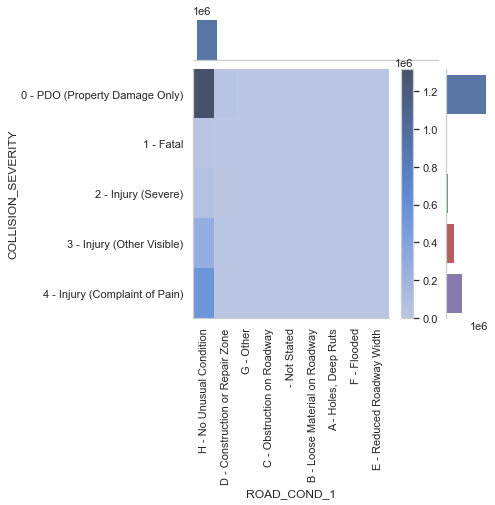

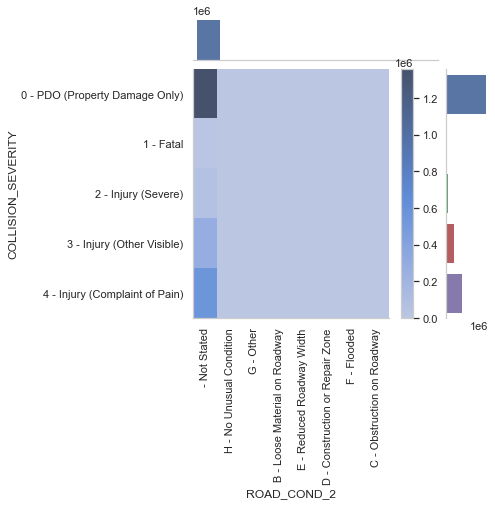

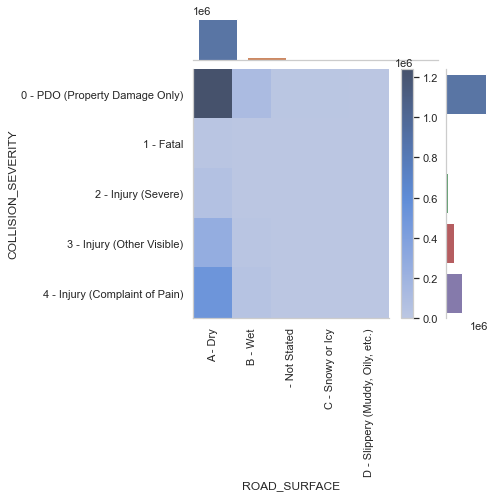

In [50]:
# plot the distribution of collision severity based on the road conditions for ROAD_COND_1
display(pd.crosstab(weather_df['ROAD_COND_1'],weather_df['COLLISION_SEVERITY']))

ax1 = sns.JointGrid(data=weather_df, x='ROAD_COND_1', y='COLLISION_SEVERITY', height=5)

ax1.plot_joint(sns.histplot, cbar=True)
ax1.plot_marginals(sns.countplot)
for tick in ax1.ax_joint.get_xticklabels():         
    tick.set_rotation(90)
    
# plot the distribution of collision severity based on the road conditions for ROAD_COND_2
display(pd.crosstab(weather_df['ROAD_COND_2'],weather_df['COLLISION_SEVERITY']))

ax1 = sns.JointGrid(data=weather_df, x='ROAD_COND_2', y='COLLISION_SEVERITY', height=5)
ax1.plot_joint(sns.histplot, cbar=True)
ax1.plot_marginals(sns.countplot)
for tick in ax1.ax_joint.get_xticklabels():         
    tick.set_rotation(90)   
    
# plot the distribution of collision severity based on the road surface
display(pd.crosstab(weather_df['ROAD_SURFACE'],weather_df['COLLISION_SEVERITY']))

ax1 = sns.JointGrid(data=weather_df, x='ROAD_SURFACE', y='COLLISION_SEVERITY', height=5)
ax1.plot_joint(sns.histplot, cbar=True)
ax1.plot_marginals(sns.countplot)
for tick in ax1.ax_joint.get_xticklabels():         
    tick.set_rotation(90) 

### 19. Collision Severity Based on Intersection/State Hwy *(countplot/scatterplot)*

In [51]:
# create a copy of collisions dataframe to change collision severity text values
location_type_df = collisions_df.copy()

# replace column values with descriptive text
location_type_df['COLLISION_SEVERITY'].replace(severity_values, inplace=True)

In [52]:
display(pd.crosstab(location_type_df['COLLISION_SEVERITY'],location_type_df['INTERSECTION']))
display(pd.crosstab(location_type_df['COLLISION_SEVERITY'],location_type_df['STATE_HWY_IND']))

INTERSECTION,-,N,Y
COLLISION_SEVERITY,,,
0 - PDO (Property Damage Only),9260,1125661,232203
1 - Fatal,29,13899,3369
2 - Injury (Severe),256,48321,16088
3 - Injury (Other Visible),1522,193123,89138
4 - Injury (Complaint of Pain),2819,381334,177723


STATE_HWY_IND,N,Y
COLLISION_SEVERITY,,
0 - PDO (Property Damage Only),767315,599064
1 - Fatal,10135,7161
2 - Injury (Severe),41172,23447
3 - Injury (Other Visible),193864,89739
4 - Injury (Complaint of Pain),366574,194894


COLLISION_SEVERITY,0 - PDO (Property Damage Only),1 - Fatal,2 - Injury (Severe),3 - Injury (Other Visible),4 - Injury (Complaint of Pain)
INTERSECTION,,,,,
-,66.685871,0.208843,1.843583,10.960680,20.301023
N,63.873162,0.788668,2.741869,10.958341,21.637960
Y,44.781793,0.649733,3.102671,17.190818,34.274986


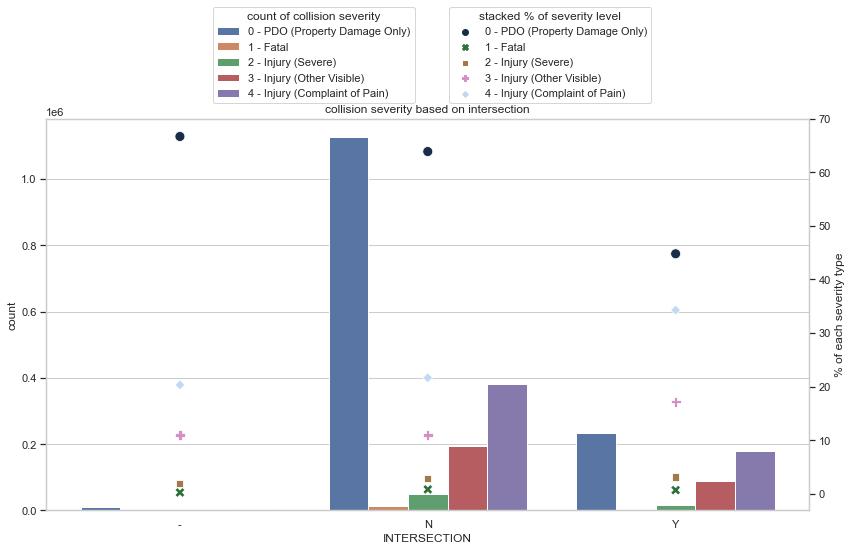

In [53]:
# calculate percentages of collision severity for each intersection value
location_type_pct = pd.crosstab(location_type_df['INTERSECTION'],location_type_df['COLLISION_SEVERITY'],).apply(lambda r: r/r.sum()*100, axis=1)
display(location_type_pct)

# plot the data
fig, ax1 = plt.subplots(figsize=(12,8))

# plot bar graph of collision severity counts
ax1 = sns.countplot(x='INTERSECTION', hue='COLLISION_SEVERITY', data = location_type_df,
                    order=location_type_df['INTERSECTION'].value_counts().index.sort_values(),
                    hue_order=location_type_df['COLLISION_SEVERITY'].value_counts().index.sort_values())

ax1.set_title('collision severity based on intersection')
ax1.tick_params(axis='y')
ax1.legend(title='count of collision severity', bbox_to_anchor=(0.49,1.3))

# plot percentages of severity level on same axis
ax2 = ax1.twinx()

ax2 = sns.scatterplot(data=location_type_pct, s=100, palette="cubehelix")

ax2.grid(False)
ax2.set_ylabel('% of each severity type')
ax2.tick_params(axis='y')
ax2.legend(title='stacked % of severity level', bbox_to_anchor=(.8,1.3))

fig.tight_layout();

> **Observations:** Property damage is the leading result of the severity of the collision, but is a higher percentage of total collision outcomes, when the accident occurs in an intersection.

COLLISION_SEVERITY,0 - PDO (Property Damage Only),1 - Fatal,2 - Injury (Severe),3 - Injury (Other Visible),4 - Injury (Complaint of Pain)
STATE_HWY_IND,,,,,
N,55.640436,0.734921,2.985512,14.057691,26.581440
Y,65.521243,0.783218,2.564462,9.814996,21.316082


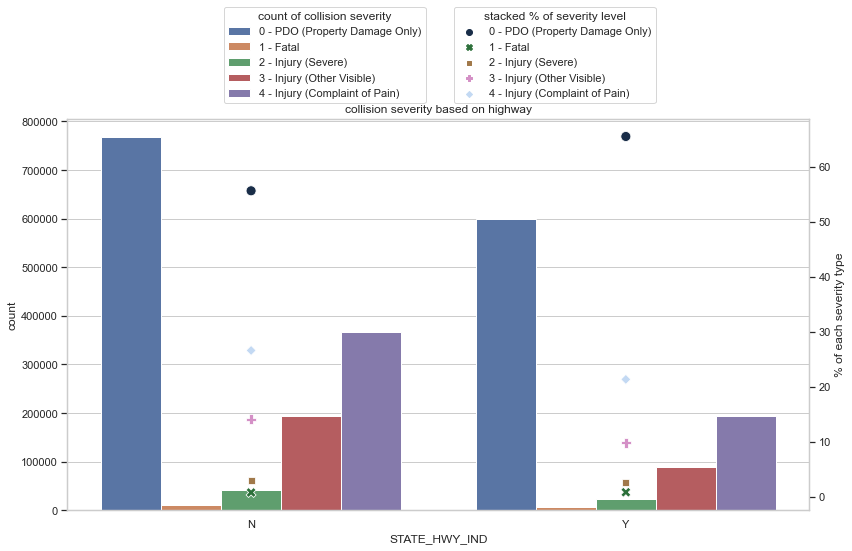

In [54]:
# calculate percentages of collision severity for each highway value
location_type_pct = pd.crosstab(location_type_df['STATE_HWY_IND'],location_type_df['COLLISION_SEVERITY'],).apply(lambda r: r/r.sum()*100, axis=1)
display(location_type_pct)

# plot the data
fig, ax1 = plt.subplots(figsize=(12,8))

# plot bar graph of collision severity counts
ax1 = sns.countplot(x='STATE_HWY_IND', hue='COLLISION_SEVERITY', data = location_type_df,
                    order=location_type_df['STATE_HWY_IND'].value_counts().index.sort_values(),
                    hue_order=location_type_df['COLLISION_SEVERITY'].value_counts().index.sort_values())

ax1.set_title('collision severity based on highway')
ax1.tick_params(axis='y')
ax1.legend(title='count of collision severity', bbox_to_anchor=(0.49,1.3))

# plot percentages of severity level on same axis
ax2 = ax1.twinx()

ax2 = sns.scatterplot(data=location_type_pct, s=100, palette="cubehelix")

ax2.grid(False)
ax2.set_ylabel('% of each severity type')
ax2.tick_params(axis='y')
ax2.legend(title='stacked % of severity level', bbox_to_anchor=(.8,1.3))

fig.tight_layout();

## Party Statistics

### 20. Party By Gender and Age and Race *(stripplot)*

In [55]:
display(parties_df.groupby('PARTY_SEX')['CASE_ID'].count())
display(parties_df.groupby('PARTY_AGE')['CASE_ID'].count())

PARTY_SEX
-     689849
F    1470843
M    2414980
Name: CASE_ID, dtype: int64

PARTY_AGE
0         963
1         303
2         347
3         364
4         410
5         466
6         530
7         671
8         821
9         931
10       1188
11       1514
12       2194
13       2747
14       3582
15       5837
16      22895
17      42918
18      79941
19      96804
20     101192
21     105793
22     108727
23     108923
24     109554
25     109270
26     107137
27     104079
28     100534
29      96081
30      91776
31      87702
32      85403
33      81967
34      80489
35      78228
36      75969
37      74154
38      71425
39      68528
40      66700
41      63909
42      61940
43      61429
44      60222
45      60745
46      60966
47      61755
48      60660
49      59989
50      58404
51      57530
52      57086
53      57084
54      56317
55      55246
56      53871
57      51826
58      49847
59      47865
60      45633
61      42577
62      40153
63      36962
64      34136
65      31359
66      28679
67      26333
68      24330
69      22818
70      20

In [56]:
# create a dataframe that only has people and realistic ages
mask = (parties_df['PARTY_SEX'] != '-') & (parties_df['PARTY_AGE'] < 120)
partystats_df = parties_df[mask].copy()
partystats_df['RACE'].replace(race_values, inplace=True)

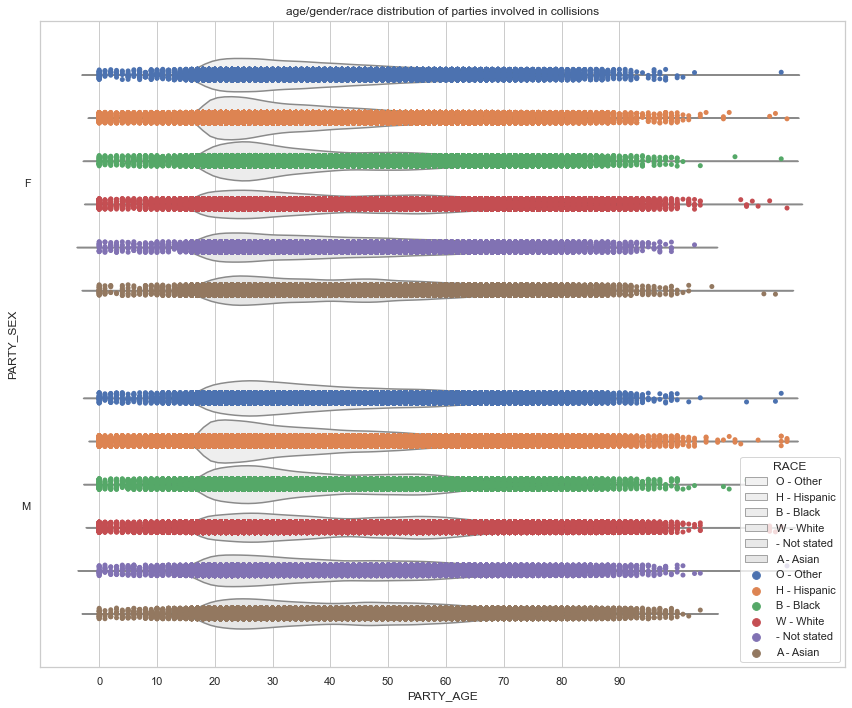

In [57]:
# Draw a categorical scatterplot to show each observation
fig, ax = plt.subplots(figsize =(12,10))
ax = sns.stripplot(data=partystats_df, x='PARTY_AGE', y='PARTY_SEX', hue='RACE', dodge=True)
ax = sns.violinplot(data=partystats_df, x='PARTY_AGE', y='PARTY_SEX', hue='RACE', inner=None, color='.9')

ax.set(xticks=np.arange(0,100,10))
ax.title.set_text('age/gender/race distribution of parties involved in collisions')
fig.tight_layout();

> **Observations:** The distribution of collisions is noticeably higher in the 20-30 age group, with more collisions occurring when the race is Hispanic, Black, or Other; regardless of gender. However, whether there is any significant correlation deserves further analysis.

### 21. Gender/Age/Race of Parties at Fault *(stripplot & violinplot)*

In [58]:
# create a dataframe that only has people and realistic ages and at fault
mask = (parties_df['PARTY_SEX'] != '-') & (parties_df['PARTY_AGE'] < 120) & (parties_df['AT_FAULT'] == 'Y')
partyatfault_df = parties_df[mask].copy()
partyatfault_df['RACE'].replace(race_values, inplace=True)

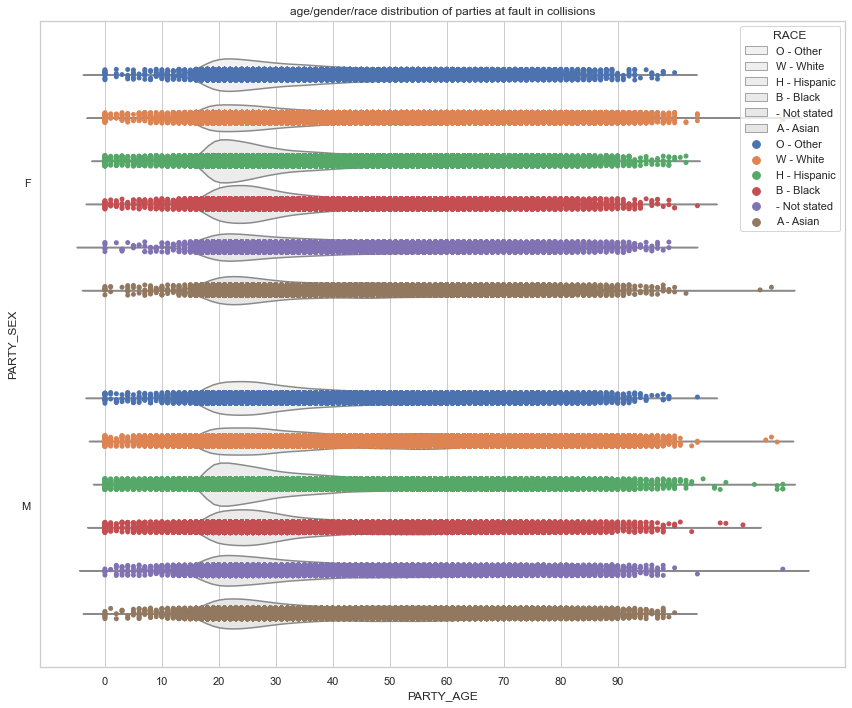

In [59]:
# Draw a categorical scatterplot to show each observation
fig, ax = plt.subplots(figsize =(12,10))

ax = sns.violinplot(data=partyatfault_df, x='PARTY_AGE', y='PARTY_SEX', hue='RACE', inner=None, color='.9')
ax = sns.stripplot(data=partyatfault_df, x='PARTY_AGE', y='PARTY_SEX', hue='RACE', dodge=True)

ax.title.set_text('age/gender/race distribution of parties at fault in collisions')
ax.set(xticks=np.arange(0,100,10))
fig.tight_layout();

> **Observations:** This visualization shows similar results to the previous plot.

### 22. Vehicle Type and Pre-Collision Movement By Age for Parties at Fault *(histogram)*

In [60]:
# create dataframe of parties at fault vehicle type and pre-collision movement
partyatfault_vehicle_df = partyatfault_df[['PARTY_AGE','STWD_VEHICLE_TYPE', 'MOVE_PRE_ACC', 'OAF_VIOL_CAT']].copy()

# replace column values with descriptive text
partyatfault_vehicle_df['STWD_VEHICLE_TYPE'].replace(partyatfault_vehicle_values, inplace=True)
partyatfault_vehicle_df['MOVE_PRE_ACC'].replace(partyatfault_movement_values, inplace=True)
partyatfault_vehicle_df['OAF_VIOL_CAT'].replace(oaf_values, inplace=True)

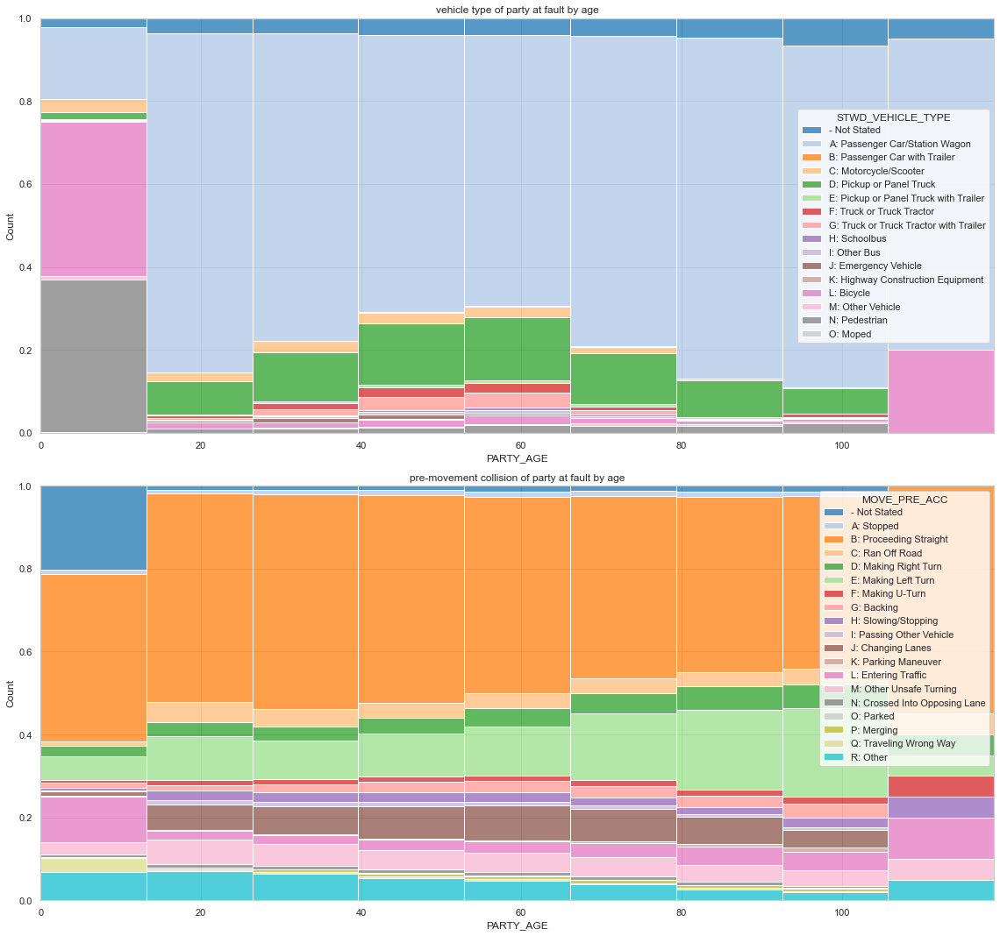

In [61]:
# create histograms of vehicle type and pre-collision movement, broken down by age
fig, (ax1, ax2) = plt.subplots(2,1, figsize =(16,15))

ax1 = sns.histplot(data=partyatfault_vehicle_df, x='PARTY_AGE', hue='STWD_VEHICLE_TYPE', 
                   hue_order=partyatfault_vehicle_df['STWD_VEHICLE_TYPE'].value_counts().index.sort_values(),
                   palette='tab20', multiple='fill', ax=ax1, bins=9)
ax2 = sns.histplot(data=partyatfault_vehicle_df, x='PARTY_AGE', hue='MOVE_PRE_ACC', 
                   hue_order=partyatfault_vehicle_df['MOVE_PRE_ACC'].value_counts().index.sort_values(),
                   palette='tab20', multiple='fill', ax=ax2, bins=9)

ax1.title.set_text('vehicle type of party at fault by age')
ax2.title.set_text('pre-movement collision of party at fault by age')
fig.tight_layout();

### 23. Violation Category By Age for Parties at Fault *(boxenplot)*

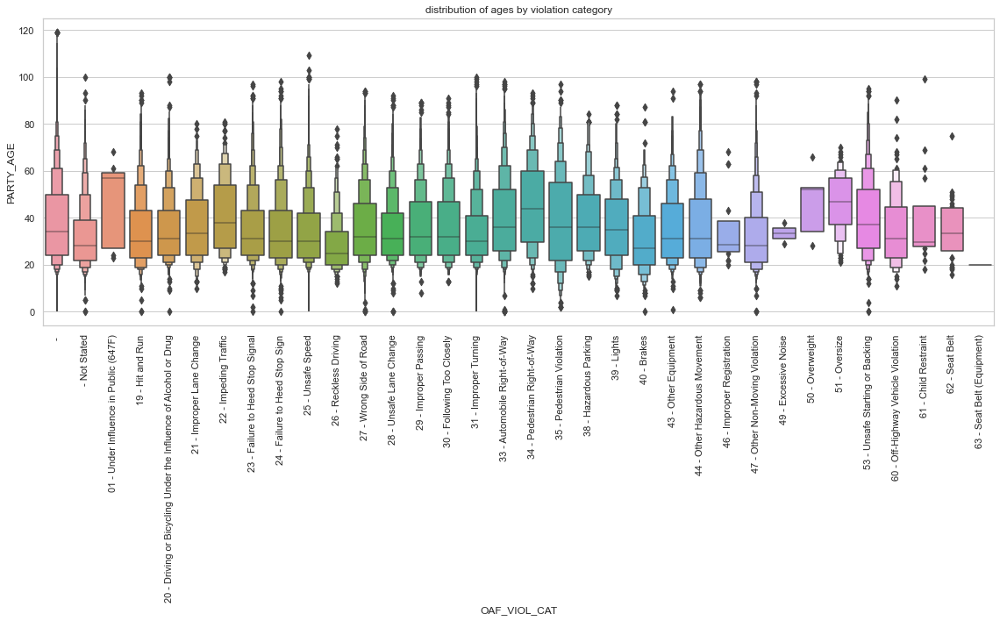

In [62]:
# plot ages of parties based on violation category
fig, ax = plt.subplots(figsize =(16,10))

ax = sns.boxenplot(x='OAF_VIOL_CAT', y='PARTY_AGE', data=partyatfault_vehicle_df, 
                   order=partyatfault_vehicle_df['OAF_VIOL_CAT'].value_counts().index.sort_values())

ax.title.set_text('distribution of ages by violation category')
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
fig.tight_layout();

> **Observations:** This plot helps visualize which violations occur the most for different age groups.

## Victim Statistics

### 24. Victim Role By Age *(scatterplot)*

In [63]:
# create a dataframe that only has people and realistic ages
mask = ((victims_df['VICTIM_SEX'] != '-') & (victims_df['VICTIM_AGE'] < 120) & 
        (victims_df['VICTIM_ROLE'] != 6) & (victims_df['VICTIM_DEGREE_OF_INJURY'] != 0)) 
        # remove non-injured party and no injury
victimstats_df = victims_df[mask].copy()
victimstats_df['VICTIM_ROLE'].replace(victim_values, inplace=True)
victimstats_df['VICTIM_DEGREE_OF_INJURY'].replace(injury_values, inplace=True)

In [64]:
# fix formatting issue of column data type
victimstats_df['VICTIM_AGE'] = victimstats_df['VICTIM_AGE'].astype(int)
victimstats_df['VICTIM_ROLE'] = victimstats_df['VICTIM_ROLE'].astype(str)                                                                 

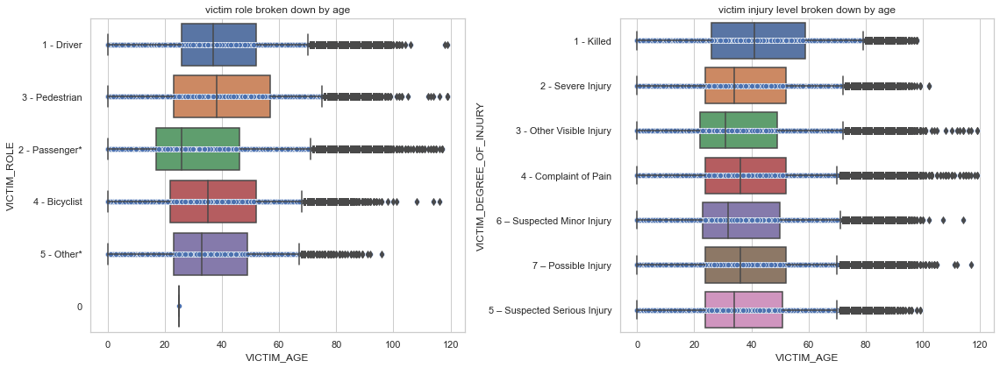

In [65]:
# create scatterplot of victim's role, broken down by age
fig, (ax1,ax2) = plt.subplots(1,2, figsize =(16,6))

ax1 = sns.scatterplot(data=victimstats_df, x='VICTIM_AGE', y='VICTIM_ROLE', ax=ax1)
ax1 = sns.boxplot(data=victimstats_df, x='VICTIM_AGE', y='VICTIM_ROLE', ax=ax1, 
                  whis=[0, 95])

ax2 = sns.scatterplot(data=victimstats_df, x='VICTIM_AGE', y='VICTIM_DEGREE_OF_INJURY', ax=ax2)
ax2 = sns.boxplot(data=victimstats_df, x='VICTIM_AGE', y='VICTIM_DEGREE_OF_INJURY', ax=ax2,
                  whis=[0, 95])

ax1.title.set_text('victim role broken down by age')
ax2.title.set_text('victim injury level broken down by age')
fig.tight_layout();

> 2 - Passenger* (includes non-operator on bicycle or any victim on/in parked vehicle or multiple victims on/in non-motor vehicle)<br>
  5 - Other* (single victim on/in non-motor vehicle


### 25. Victim Injury Level Based on Insufficient Safety Equipment *(FacetGrid: countplot)*

**Code Breakdown:**
- A - None in Vehicle
- B - Unknown
- C - Lap Belt Used
- D - Lap Belt Not Used
- E - Shoulder Harness Used
- F - Shoulder Harness Not Used
- G - Lap/Shoulder Harness Used
- H - Lap/Shoulder Harness Not Used
- J - Passive Restraint Used
- K - Passive Restraint Not Used
- L - Air Bag Deployed
- M - Air Bag Not Deployed
- N - Other
- P - Not Required
- Q - Child Restraint in Vehicle Used
- R - Child Restraint in Vehicle Not Used
- S - Child Restraint in Vehicle, Use Unknown
- T - Child Restraint in Vehicle, Improper Use
- U - No Child Restraint in Vehicle
- V - Driver, Motorcycle Helmet Not Used
- W - Driver, Motorcycle Helmet Used
- X - Passenger, Motorcycle Helmet Not Used
- Y - Passenger, Motorcycle Helmet Used
- \- or blank -  Not Stated

In [66]:
# create a dataframe that only has parties that didn't have proper safety equipment
mask = ((victims_df['VICTIM_SAFETY_EQUIP_1'] == 'A') | (victims_df['VICTIM_SAFETY_EQUIP_1'] == 'D') |
        (victims_df['VICTIM_SAFETY_EQUIP_1'] == 'F') | (victims_df['VICTIM_SAFETY_EQUIP_1'] == 'H') |
        (victims_df['VICTIM_SAFETY_EQUIP_1'] == 'K') | (victims_df['VICTIM_SAFETY_EQUIP_1'] == 'R') |
        (victims_df['VICTIM_SAFETY_EQUIP_1'] == 'T') | (victims_df['VICTIM_SAFETY_EQUIP_1'] == 'U') |
        (victims_df['VICTIM_SAFETY_EQUIP_1'] == 'V') | (victims_df['VICTIM_SAFETY_EQUIP_1'] == 'X') |
        (victims_df['VICTIM_SAFETY_EQUIP_2'] == 'A') | (victims_df['VICTIM_SAFETY_EQUIP_2'] == 'D') |
        (victims_df['VICTIM_SAFETY_EQUIP_2'] == 'F') | (victims_df['VICTIM_SAFETY_EQUIP_2'] == 'H') |
        (victims_df['VICTIM_SAFETY_EQUIP_2'] == 'K') | (victims_df['VICTIM_SAFETY_EQUIP_2'] == 'R') |
        (victims_df['VICTIM_SAFETY_EQUIP_2'] == 'T') | (victims_df['VICTIM_SAFETY_EQUIP_2'] == 'U') |
        (victims_df['VICTIM_SAFETY_EQUIP_2'] == 'V') | (victims_df['VICTIM_SAFETY_EQUIP_2'] == 'X'))
victimsafety_df = victims_df[mask].copy()

In [67]:
# replace codes with descriptive text
victimsafety_df['VICTIM_DEGREE_OF_INJURY'].replace(injury_values, inplace=True)
victimsafety_df['VICTIM_EJECTED'].replace(eject_values, inplace=True)
victimsafety_df['VICTIM_ROLE'].replace(victim_values, inplace=True)

In [68]:
# fix formatting issue of column data type
victimsafety_df['VICTIM_ROLE'] = victimsafety_df['VICTIM_ROLE'].astype(str)
victimsafety_df['VICTIM_DEGREE_OF_INJURY'] = victimsafety_df['VICTIM_DEGREE_OF_INJURY'].astype(str)
victimsafety_df['VICTIM_EJECTED'] = victimsafety_df['VICTIM_EJECTED'].astype(str)

In [69]:
# create new dataframe with grouped multilevel data 
victimsafety_df = pd.DataFrame(victimsafety_df.groupby(['VICTIM_ROLE', 'VICTIM_DEGREE_OF_INJURY', 'VICTIM_EJECTED' ])['CASE_ID'].count())

# flatten multilevel index
victimsafety_df = victimsafety_df.stack().reset_index()

# delete and rename columns
del victimsafety_df['level_3']
victimsafety_df.rename(columns = {0:'count'}, inplace = True)

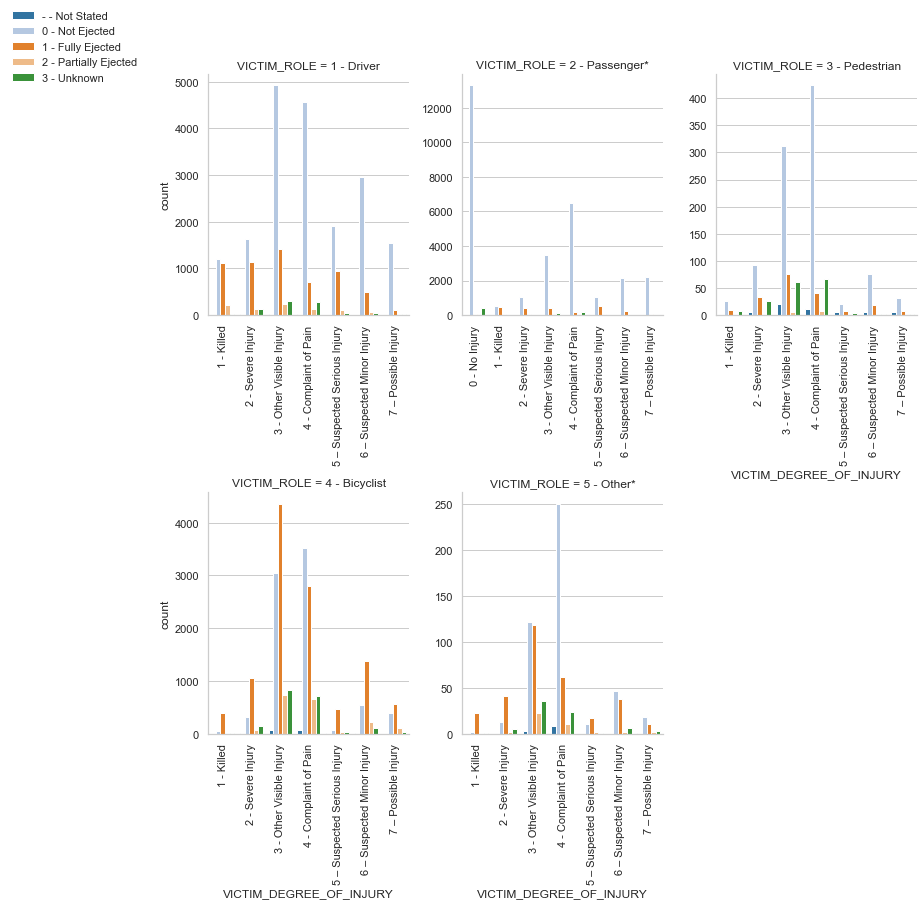

In [70]:
# plot data to examine if victim was ejected and degree of injury, based on victim role
ax = sns.FacetGrid(victimsafety_df, col='VICTIM_ROLE', height=6, col_wrap=3, aspect=.5, sharey=False, sharex=False)
ax.map(sns.barplot, 'VICTIM_DEGREE_OF_INJURY', 'count', hue=victimsafety_df['VICTIM_EJECTED'],
       hue_order=victimsafety_df['VICTIM_EJECTED'].value_counts().index.sort_values(), palette='tab20')

ax.add_legend(bbox_to_anchor=(0, 1))
for axes in ax.axes.flat:
    _ = axes.set_xticklabels(axes.get_xticklabels(), rotation=90)

plt.tight_layout();

> 2 - Passenger* (includes non-operator on bicycle or any victim on/in parked vehicle or multiple victims on/in non-motor vehicle)<br>
  5 - Other* (single victim on/in non-motor vehicle)

> **Observations:** When the victim was a driver, the data shows them to have been fully ejected from the vehicle more times than passengers.

## Collision Statistics

In [71]:
collision_severity_df = collisions_df.copy()

# replace column values with descriptive text
collision_severity_df['COLLISION_SEVERITY'].replace(severity_values, inplace=True)
collision_severity_df['TYPE_OF_COLLISION'].replace(type_values, inplace=True)
collision_severity_df['PCF_VIOL_CATEGORY'].replace(pcf_values, inplace=True)
collision_severity_df['MVIW'].replace(mviw_values, inplace=True)
collision_severity_df['HIT_AND_RUN'].replace(hitrun_values, inplace=True)
collision_severity_df['DIRECTION'].replace(direction_values, inplace=True)

# create new column to sum up any injury or death in collision
collision_severity_df['total_trauma'] = collision_severity_df['NUMBER_INJURED'] + collision_severity_df['NUMBER_KILLED']

### 26. Injuries or Death Based on Violation Category *(pointplot)*

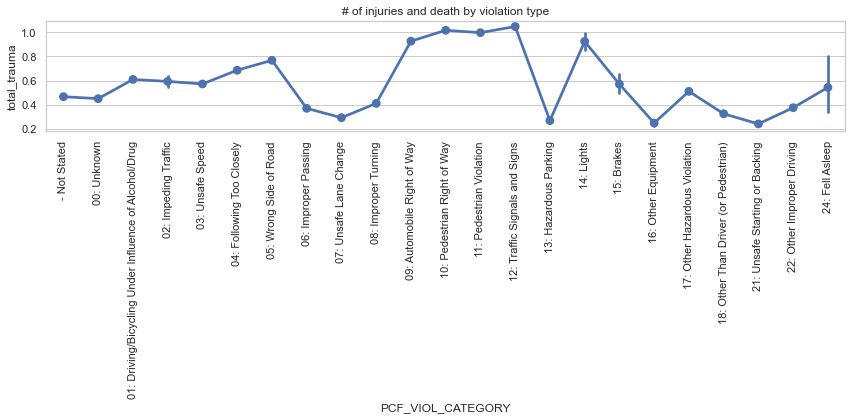

In [72]:
# plot the mean number of injuries or death based on violation type
fig, ax = plt.subplots(figsize =(12,6))

ax = sns.pointplot(x='PCF_VIOL_CATEGORY', y='total_trauma', data=collision_severity_df,
                   order=collision_severity_df['PCF_VIOL_CATEGORY'].value_counts().index.sort_values())

ax.title.set_text('# of injuries and death by violation type')
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
fig.tight_layout();

### 27. Type of Collision and Severity Level For Collisions with Injuries or Death *(countplot)*

In [73]:
# create a dataframe of collisions where injuries or death did happen
collision_severity_subset_df = collision_severity_df.copy()
mask = ((collision_severity_subset_df['NUMBER_INJURED'] != 0) | (collision_severity_subset_df['NUMBER_KILLED'] != 0))
collision_severity_subset_df = collision_severity_subset_df[mask]

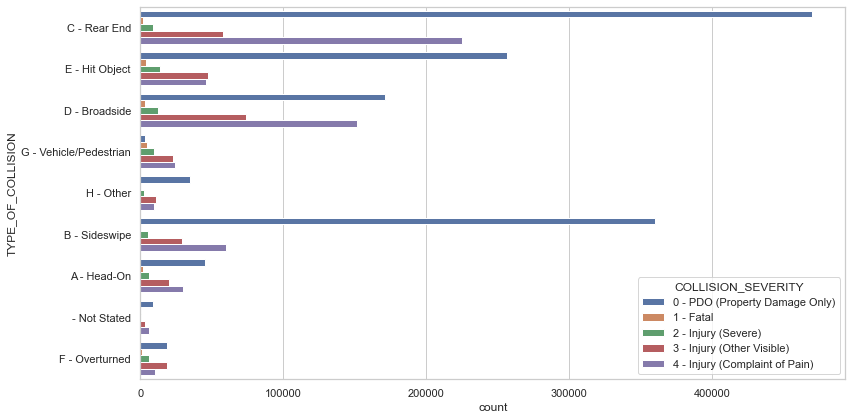

In [74]:
# create plots to show type of collisions and collision severity and injuries per collisions
fig, ax = plt.subplots(figsize =(12,6))

ax = sns.countplot(y='TYPE_OF_COLLISION', hue='COLLISION_SEVERITY', data=collision_severity_df,
                   hue_order=collision_severity_df['COLLISION_SEVERITY'].value_counts().index.sort_values())
fig.tight_layout();

> **Observations:** When the collision was a rear-end incident, there was a greater occurence of property damage than any other type of collision. The most fatal type of collisions was with hitting objects, a broadside collision, or with another vehicle/pedestrian. Also of note is that the highest number of injury with complaint of pain occurred in a rear-end incident.

### 28. Type of Collision and Violation Category/What the Vehicle was Involved With *(countplot)*

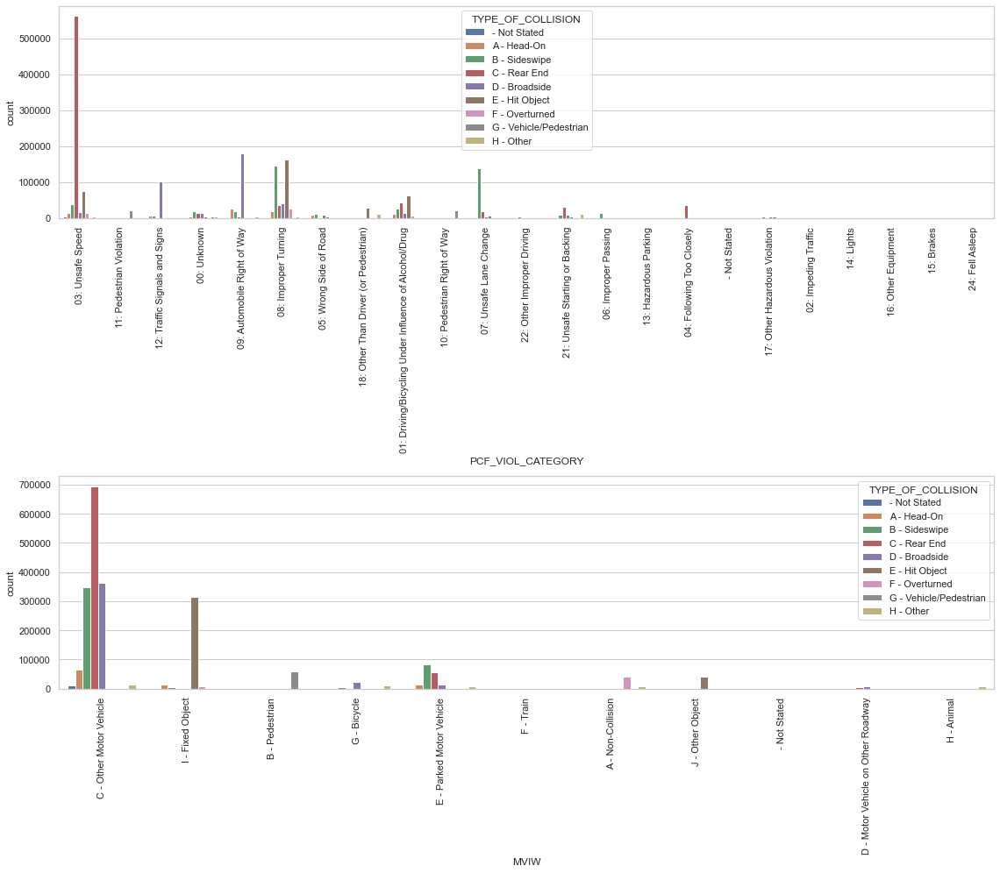

In [75]:
# create plots to show violation category and what the motor vehicle was involved with 
fig, (ax1,ax2) = plt.subplots(2,1, figsize =(16,14))

ax1 = sns.countplot(x='PCF_VIOL_CATEGORY', hue='TYPE_OF_COLLISION', data=collision_severity_df,
                 hue_order=collision_severity_df['TYPE_OF_COLLISION'].value_counts().index.sort_values(),
                 ax=ax1)
ax2 = sns.countplot(x='MVIW', hue='TYPE_OF_COLLISION', data=collision_severity_df,
                 hue_order=collision_severity_df['TYPE_OF_COLLISION'].value_counts().index.sort_values(),
                 ax=ax2)

ax1.set_xticklabels(ax1.get_xticklabels(),rotation=90)
ax2.set_xticklabels(ax2.get_xticklabels(),rotation=90)
fig.tight_layout();

> **Observations:** A rear-end collision had the greatest number of occurences when the violation was for unsafe speed.

### 29. Vehicle Towed Away Based on Collision Severity *(heatmap)*

COLLISION_SEVERITY,0 - PDO (Property Damage Only),1 - Fatal,2 - Injury (Severe),3 - Injury (Other Visible),4 - Injury (Complaint of Pain)
TOW_AWAY,,,,,
-,13223,42,474,2583,5730
N,804598,3134,17761,88338,226131
Y,549303,14121,46430,192862,330015


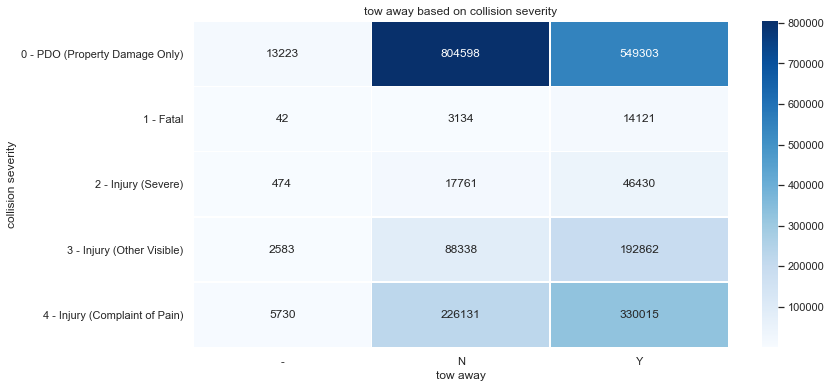

In [76]:
# examine tow away status based on collision severity
display(pd.crosstab(collision_severity_df['TOW_AWAY'],collision_severity_df['COLLISION_SEVERITY']))

# plot tow away value based on collision severity
f, ax = plt.subplots(figsize=(12, 6))

col_severity_heatmap_df = pd.DataFrame(collision_severity_df.groupby(['TOW_AWAY','COLLISION_SEVERITY'])['CASE_ID'].count())
col_severity_heatmap_df.reset_index(inplace=True)
severity_heatmap_df = col_severity_heatmap_df.pivot(index='COLLISION_SEVERITY', columns='TOW_AWAY', values='CASE_ID')

ax = sns.heatmap(severity_heatmap_df, annot=True, linewidths=.5, fmt='.0f', cmap='Blues', ax=ax)

ax.title.set_text('tow away based on collision severity')
ax.set_ylabel('collision severity')
ax.set_xlabel('tow away')
fig.tight_layout();

### 30. Pre-Collision Direction and Collision Severity *(stripplot & pointplot & violinplot)*

In [77]:
# rename and renumber collision severity equal to 0, to create visualization
collision_direction_df = collisions_df.copy()

collision_severity_df.loc[collision_severity_df['COLLISION_SEVERITY'] == '0 - PDO (Property Damage Only)', 'COLLISION_SEVERITY'] = '5 - PDO (Property Damage Only)'

collision_direction_df.loc[collision_direction_df['COLLISION_SEVERITY'] == 0, 'COLLISION_SEVERITY'] = 5

In [78]:
collision_direction_df[collision_direction_df['COLLISION_SEVERITY'] == 5]

COLLISION_SEVERITY,1 - Fatal,2 - Injury (Severe),3 - Injury (Other Visible),4 - Injury (Complaint of Pain),5 - PDO (Property Damage Only)
DIRECTION,,,,,
"- Not Stated, in Intersection",3548,16947,93250,185549,256040
E - East,3228,11227,44533,87223,249616
N - North,3569,12645,50266,100847,303818
S - South,3716,12713,51522,102523,308233
W - West,3236,11133,44212,85734,249417


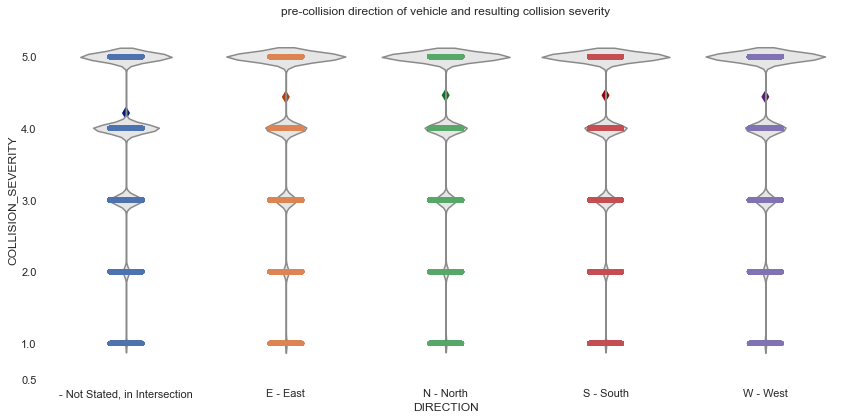

In [79]:
# examine the direction of the vehicle pre-collision and the resulting collision severity
display(pd.crosstab(collision_severity_df['DIRECTION'],collision_severity_df['COLLISION_SEVERITY']))

# plot ages of parties based on violation category
with sns.axes_style("white"):
    fig, ax = plt.subplots(figsize =(12,6))
    sns.despine(bottom=True, left=True)

    ax = sns.stripplot(x=collision_severity_df['DIRECTION'], y=collision_direction_df['COLLISION_SEVERITY'], 
                       dodge=True, alpha=.75)

    # show the conditional means
    ax = sns.pointplot(x=collision_severity_df['DIRECTION'], y=collision_direction_df['COLLISION_SEVERITY'],
                       order=collision_severity_df['DIRECTION'].value_counts().index.sort_values(),
                       join=False, palette='dark', markers='d', ci=None)
    
    ax = sns.violinplot(x=collision_severity_df['DIRECTION'], y=collision_direction_df['COLLISION_SEVERITY'], inner=None, color='.9',
                         order=collision_severity_df['DIRECTION'].value_counts().index.sort_values())
    
    ax.title.set_text('pre-collision direction of vehicle and resulting collision severity')
    ax.set(ylim=(0.5,5.5))
    plt.yticks([0.5,1,2,3,4,5])
    fig.tight_layout();

## Alcohol-Involved Statistics

### 31. Age/Gender and Sobriety of Party at Fault *(swarmplot)*

In [80]:
# create a dataframe of collisions with parties found at fault with alcohol involved
mask = ((parties_df['PARTY_SEX'] != '-') & (parties_df['PARTY_AGE'] < 120) & (parties_df['AT_FAULT'] == 'Y') &
        (parties_df['PARTY_SOBRIETY'] != 'A') & (parties_df['PARTY_SOBRIETY'] != 'G') & 
        (parties_df['PARTY_SOBRIETY'] != 'H') & (parties_df['PARTY_SOBRIETY'] != '-'))
partyatfault_sobriety_df = parties_df[mask].copy()

# replace column values with descriptive text
partyatfault_sobriety_df['PARTY_SOBRIETY'].replace(alcohol_values, inplace=True)

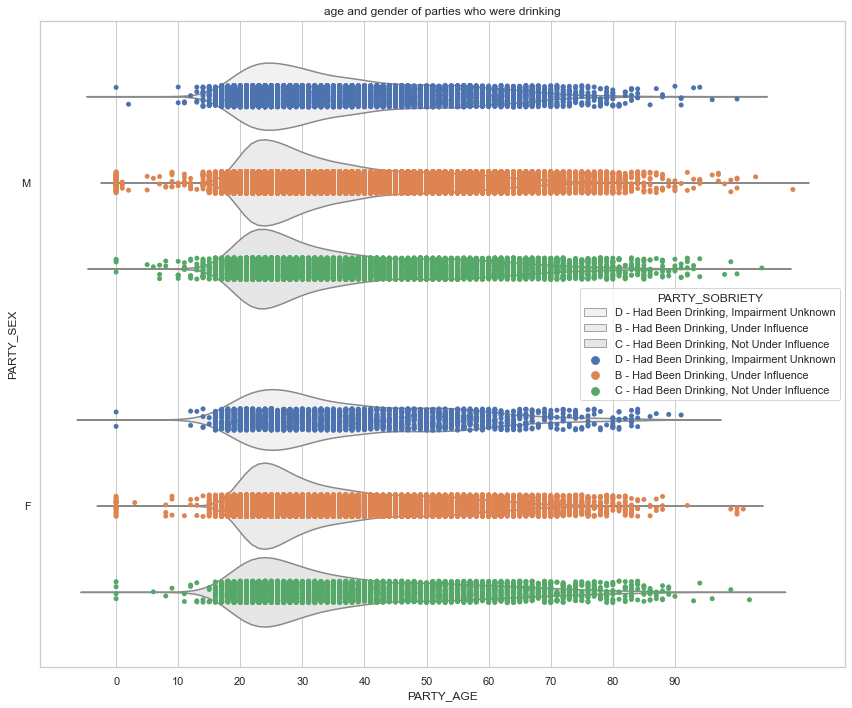

In [81]:
# Draw a categorical scatterplot to show each observation
fig, ax = plt.subplots(figsize =(12,10))
# ax = sns.splitplot(data=partyatfault_sobriety_df, x='PARTY_AGE', y='PARTY_SEX', hue='PARTY_SOBRIETY', dodge=True)
ax = sns.stripplot(data=partyatfault_sobriety_df, x='PARTY_AGE', y='PARTY_SEX', hue='PARTY_SOBRIETY', dodge=True)
ax = sns.violinplot(data=partyatfault_sobriety_df, x='PARTY_AGE', y='PARTY_SEX', hue='PARTY_SOBRIETY', 
                    inner=None, color='.9')

ax.title.set_text('age and gender of parties who were drinking')
ax.set(xticks=np.arange(0,100,10))
fig.tight_layout();

> **Observations:** The greatest number of people under the influence while druiving were in the 20 - 40 age group, with a noticeable increase in the mid 20's age range, regardless of gender.

In [82]:
import datetime
print(datetime.datetime.now())

2021-11-29 20:01:54.685932


### 32. Alcohol-Involved Collisions Over Time *(overlapping barplots)*

In [83]:
# create dataframes of collisions grouped by year, total and specifically, alcohol-related
total_collisions_df = pd.DataFrame(collisions_df.groupby(['ACCIDENT_YEAR'])['CASE_ID'].count()
                                  ).sort_values('ACCIDENT_YEAR')
alcohol_collisions_df = pd.DataFrame(collisions_df[collisions_df['ALCOHOL_INVOLVED'] == 'Y']
                                    .groupby(['ACCIDENT_YEAR'])['CASE_ID'].count()).sort_values('ACCIDENT_YEAR')

In [84]:
# rename columns
total_collisions_df = total_collisions_df.rename(columns={'CASE_ID': 'collisions'})
alcohol_collisions_df = alcohol_collisions_df.rename(columns={'CASE_ID': 'alcohol_involved'})

In [85]:
# reset the index
total_collisions_df.reset_index(inplace=True)
alcohol_collisions_df.reset_index(inplace=True)

In [86]:
# create a combined dataframe of alcohol-related collisions and total collisions
alcohol_total_df = total_collisions_df.set_index('ACCIDENT_YEAR').join(alcohol_collisions_df.set_index('ACCIDENT_YEAR'), how='inner')
alcohol_total_df.reset_index(inplace=True)
alcohol_total_df = alcohol_total_df.sort_values('ACCIDENT_YEAR')

In [87]:
# change datatype of accident year to object
alcohol_total_df['ACCIDENT_YEAR'] = alcohol_total_df['ACCIDENT_YEAR'].astype(str)

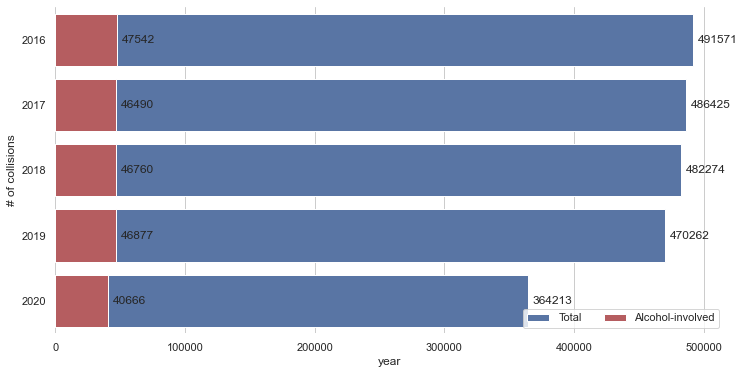

In [88]:
fig, ax = plt.subplots(figsize =(12,6))

# plot total collisions
sns.barplot(x='collisions', y='ACCIDENT_YEAR', data=alcohol_total_df,
            label="Total", color="b")

# plot collisions where alcohol was involved
ax2 = sns.barplot(x='alcohol_involved', y='ACCIDENT_YEAR', data=alcohol_total_df,
            label='Alcohol-involved', color='r', ax=ax)

# add a legend and informative axis label
ax.legend(ncol=2, loc='lower right', frameon=True)
ax.set(ylabel='# of collisions', xlabel='year')
sns.despine(left=True, bottom=True)

for p in ax2.patches:
    ax2.annotate('%.0f' % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha='left', va='center')

In [89]:
# calculate alcohol-involved percentage of total collisions
alcohol_total_df['pct'] = round(alcohol_total_df['alcohol_involved']/alcohol_total_df['collisions'],2)
alcohol_total_df

,ACCIDENT_YEAR,collisions,alcohol_involved,pct
0,2016,491571,47542,0.10
1,2017,486425,46490,0.10
2,2018,482274,46760,0.10
3,2019,470262,46877,0.10
4,2020,364213,40666,0.11


> **Observations:** Alcohol-related collisions has been pretty consistent as a percentage of total collisions - notably, the total number of incidents in 2020 is considerably lower, most likely due to less people being on the roads, due to COVID.

### 33. Alcohol-Involved Collisions by Vehicle Types and Injuries/Death *(countplot)*

In [90]:
# create a dataframe of collisions with alcohol involved
mask = (collisions_df['ALCOHOL_INVOLVED'] == 'Y')
alcohol_collisions_df = collisions_df[mask].copy()

# create a column to sum total injuries and deaths
alcohol_collisions_df['total_trauma'] = alcohol_collisions_df['NUMBER_INJURED'] + alcohol_collisions_df['NUMBER_KILLED']

mask = alcohol_collisions_df['NUMBER_INJURED'] + alcohol_collisions_df['NUMBER_KILLED'] == 0
alcohol_collisions_df.loc[mask, 'total_trauma'] = 'no injuries/deaths'

mask = alcohol_collisions_df['NUMBER_INJURED'] + alcohol_collisions_df['NUMBER_KILLED'] != 0
alcohol_collisions_df.loc[mask, 'total_trauma'] = '>1 injury/death'

# replace column values with descriptive text            
alcohol_collisions_df['STWD_VEHTYPE_AT_FAULT'].replace(partyatfault_vehicle_values, inplace=True)
alcohol_collisions_df['DAY_OF_WEEK'].replace(day_values, inplace=True)

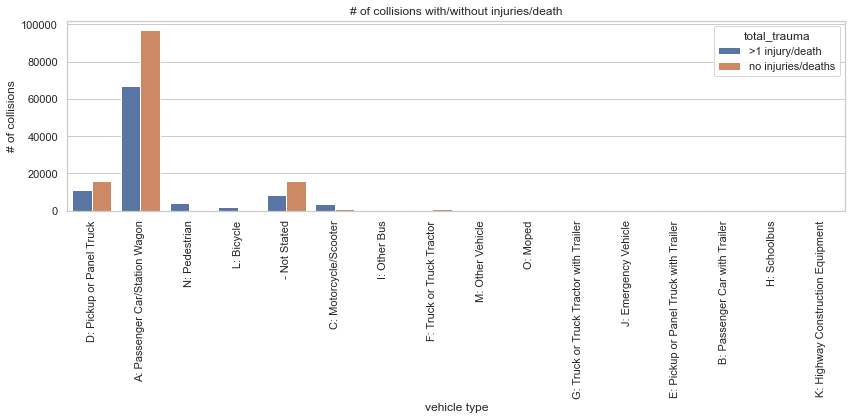

In [91]:
# plot count of alcohol-involved collisions and vehicle type
fig, ax = plt.subplots(figsize =(12,6))
ax = sns.countplot(x='STWD_VEHTYPE_AT_FAULT', hue='total_trauma', data=alcohol_collisions_df)

ax.title.set_text('# of collisions with/without injuries/death')
ax.set_ylabel('# of collisions')
ax.set_xlabel('vehicle type')
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
fig.tight_layout();

### 34. Alcohol-Involved Collisions by Date *(barplot)*

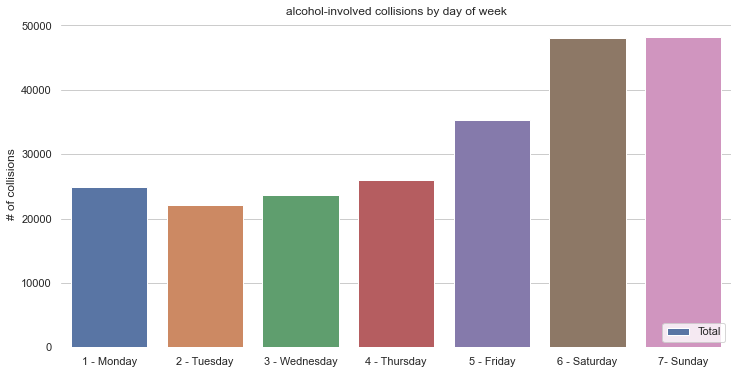

In [92]:
# create a dataframe of alcohol-involved collisions by day of the week
alcohol_days_df = pd.DataFrame(alcohol_collisions_df.groupby('DAY_OF_WEEK')['CASE_ID'].count())
alcohol_days_df.reset_index(inplace=True)

# plot total collisions
fig, ax = plt.subplots(figsize =(12,6))

sns.barplot(x='DAY_OF_WEEK', y='CASE_ID', data=alcohol_days_df, label="Total")

# add a legend and informative axis label
ax.title.set_text('alcohol-involved collisions by day of week')
ax.legend(ncol=2, loc='lower right', frameon=True)
ax.set(ylabel='# of collisions', xlabel='')
sns.despine(left=True, bottom=True)

> **Observations:** Friday, Saturday, and Sunday are the days of the week with the most alcohol-involved collisions, which follows common knowledge as most people's social events/activities occur during the weekends.

### 35. Alcohol-Involved Collisions by County (Top 20) *(barplot)*

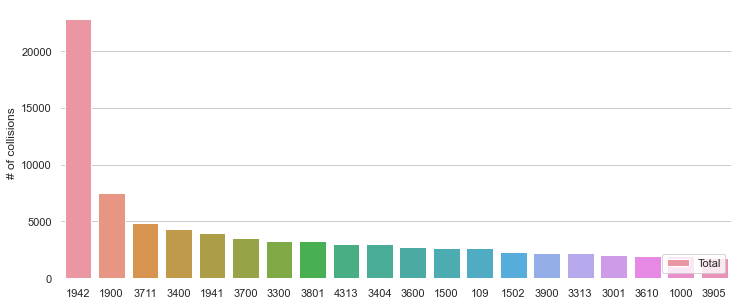

In [93]:
# create a dataframe of alcohol-involved collisions by county
alcohol_counties_df = pd.DataFrame(alcohol_collisions_df.groupby(
                               'CNTY_CITY_LOC')['CASE_ID'].count()).sort_values(by='CASE_ID', ascending=False)[:20]

alcohol_counties_df.sort_values(['CASE_ID'], ascending=False)
alcohol_counties_df.reset_index(inplace=True)

fig, ax = plt.subplots(figsize =(12,5))

# plot total collisions
sns.barplot(x='CNTY_CITY_LOC', y='CASE_ID', data=alcohol_counties_df, label='Total',
           order=alcohol_counties_df['CNTY_CITY_LOC'])

# add a legend and informative axis label
ax.legend(ncol=2, loc='lower right', frameon=True)
ax.set(ylabel='# of collisions', xlabel='')
sns.despine(left=True, bottom=True)

## Pedestrian/Bicycle/Motorcycle Statistics

### 36. Total Injuries and Deaths By Time of Day *(barplot)*

In [94]:
# create a new dataframe for total trauma of pedestrians, bicyclists, motorcyclists
nonvehicle_df = collisions_df.copy()
mask = (((nonvehicle_df['COUNT_PED_KILLED'] + nonvehicle_df['COUNT_PED_INJURED']) > 0) |
       ((nonvehicle_df['COUNT_BICYCLIST_KILLED'] + nonvehicle_df['COUNT_BICYCLIST_INJURED']) > 0) |
       ((nonvehicle_df['COUNT_MC_KILLED'] + nonvehicle_df['COUNT_MC_INJURED']) > 0))

nonvehicle_total_trauma_df = nonvehicle_df[mask]

nonvehicle_trauma_df = nonvehicle_total_trauma_df[['COLLISION_HOUR','COUNT_PED_KILLED', 'COUNT_PED_INJURED', 
                             'COUNT_BICYCLIST_KILLED', 'COUNT_BICYCLIST_INJURED', 
                             'COUNT_MC_KILLED', 'COUNT_MC_INJURED' ]]
nonvehicle_trauma_df.head()

,COLLISION_HOUR,COUNT_PED_KILLED,COUNT_PED_INJURED,COUNT_BICYCLIST_KILLED,COUNT_BICYCLIST_INJURED,COUNT_MC_KILLED,COUNT_MC_INJURED
2,Noon,0,0,0,0,1,0
3,Early Morning,1,0,0,0,0,0
5,Night,1,0,0,0,0,0
6,Noon,0,0,1,0,0,0
7,Evening,0,0,1,0,0,0


In [95]:
dfd = nonvehicle_trauma_df[['COLLISION_HOUR','COUNT_PED_INJURED']]
dfd[['COLLISION_HOUR','COUNT_PED_INJURED']].groupby('COLLISION_HOUR').sum()

,COUNT_PED_INJURED
COLLISION_HOUR,
Late Night,4190
Early Morning,9472
Morning,7228
Noon,8692
Afternoon,18683
Evening,10038
Night,9023


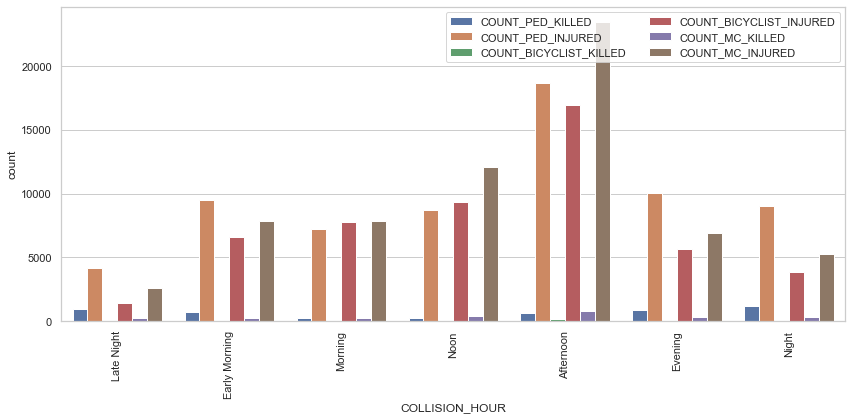

In [96]:
# melt the dataframe so it is easier to plot
nonvehicle_trauma_df_melt = nonvehicle_trauma_df.melt('COLLISION_HOUR', var_name='category', value_name='count')

# plot collisions by time of day and total trauma by category
fig, ax = plt.subplots(figsize =(12,6))

ax=sns.barplot(x='COLLISION_HOUR', y='count', hue='category', data=nonvehicle_trauma_df_melt, estimator=sum, ci=False)

ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.legend(ncol=2, loc='upper right', frameon=True)
fig.tight_layout();

> **Observations:** This visualization is in line with earlier observations that most collisions occur during the afternoon. Bicyclists are more likely to be injured in morning, noon, and afternoon times, which makes sense as most bicyclists do not ride when visibility is low at night.

### 37. Non-Vehicular Injuries/Deaths and Roads Where It Occured *(no plot)*

In [97]:
# display grouped data by road where the collisions occured and there were non-vehicular injuries/deaths

display(nonvehicle_total_trauma_df.groupby(['PRIMARY_RD'])['CASE_ID'].count().sort_values(ascending=False))
display(nonvehicle_total_trauma_df.groupby(['SECONDARY_RD'])['CASE_ID'].count().sort_values(ascending=False))

PRIMARY_RD
BROADWAY                                              989
MAIN ST                                               987
RT 1                                                  746
7TH ST                                                646
MARKET ST                                             624
WESTERN AV                                            588
3RD ST                                                574
SUNSET BL                                             528
FOOTHILL BL                                           524
4TH ST                                                509
6TH ST                                                491
CENTRAL AV                                            487
I-80 W/B                                              474
SANTA MONICA BL                                       469
PACIFIC COAST HWY                                     468
I-80 E/B                                              451
MISSION ST                                            450
US-

SECONDARY_RD
MAIN ST                                               681
BROADWAY                                              631
6TH ST                                                541
3RD ST                                                540
7TH ST                                                504
4TH ST                                                496
5TH ST                                                470
8TH ST                                                418
2ND ST                                                376
1ST ST                                                362
CENTRAL AV                                            342
WESTERN AV                                            299
VERMONT AV                                            286
GRAND AV                                              275
16TH ST                                               271
WILSHIRE BL                                           266
9TH ST                                                265
M

> **Observations:** At a surface level, this data makes sense as street names like "Broadway" and "Main St" are usually streets in downtown areas, which tend to be busier and yield more traffic and thus, a higher propensity for collisions to occur.